In [5]:
import json
import pandas as pd
import numpy as np
import os
import sys
import itertools
import matplotlib.pyplot as plt
import networkx as nx

# spatial analysis
# import geonamescache
import geopy
from geopy.geocoders import Nominatim

import conda

conda_file_dir = conda.__file__
conda_dir = conda_file_dir.split('lib')[0]
proj_lib = os.path.join(os.path.join(conda_dir, 'share'), 'proj')
os.environ["PROJ_LIB"] = proj_lib

from mpl_toolkits.basemap import Basemap
import geopandas as gpd

In [6]:
users = {}
with open(f'users/0_all_users.json') as json_file:
    users = json.load(json_file)

In [7]:
len(users)
user_ids = set([int(x) for x in users.keys()])
user_ids 
name_id_map = {}
users['896838633784606720']

for user in users:
    name_id_map[users[user]['screen_name']] = user

In [4]:
del users

In [7]:
 #edges to followers within network

In [14]:
network = {}
links = []
for auth in range(8):
    print(f'Auth: {auth}')
    for part in range(1, 21):
        try:
            with open(f'follower/2_friends_part{part}_auth{auth}.json') as json_file:
                tmp_followers = json.load(json_file)

            for user in tmp_followers:
                network_friends = []
                friends = tmp_followers[user]
                for friends_id in friends:
                    if friends_id in user_ids:
                        network_friends.append(friends_id)
                        links.append(f'{name_id_map[user]} {friends_id}')
                network[name_id_map[user]] = network_friends  
                
        except:
            print(f"Skip Part {part}")

Auth: 0
Auth: 1
Auth: 2
Auth: 3
Auth: 4
Auth: 5
Skip Part 11
Skip Part 12
Skip Part 13
Skip Part 14
Skip Part 15
Skip Part 16
Skip Part 17
Skip Part 18
Skip Part 19
Skip Part 20
Auth: 6
Skip Part 11
Auth: 7


In [15]:
len(links)

3941482

In [16]:
G = nx.parse_edgelist(links, nodetype=int, create_using=nx.DiGraph)
#nx.write_gml(G, "follower_network.gml")

0
6160


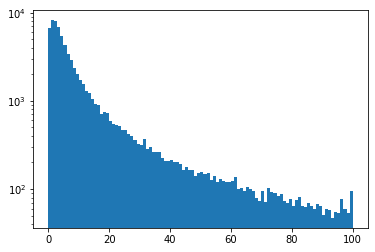

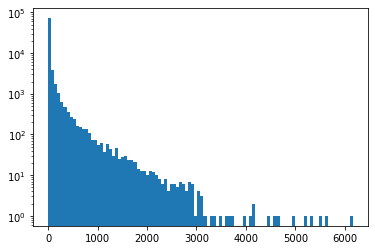

In [12]:
outdegrees = [val for (node, val) in G.out_degree()]
minDeg = min(outdegrees)
print(minDeg)
maxDeg = max(outdegrees)
print(maxDeg)
plt.hist(outdegrees, bins=100, range=[0,100])
plt.yscale('log', nonposy='clip')
plt.show()

plt.hist(outdegrees, bins=100)
plt.yscale('log', nonposy='clip')
plt.show()

Only following 33885/81612
0
41975


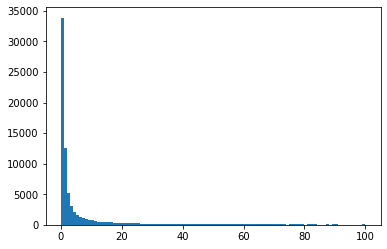

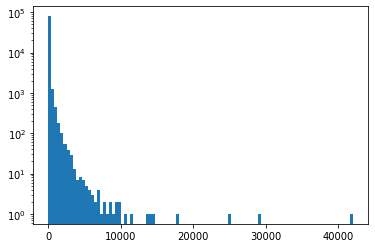

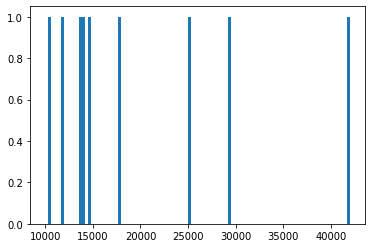

In [13]:
degrees = [val for (node, val) in G.in_degree()]
count_0 = 0 
for d in degrees:
    if d == 0:
        count_0 += 1
print(f'Only following {count_0}/{len(degrees)}')

minDeg = min(degrees)
print(minDeg)
maxDeg = max(degrees)
print(maxDeg)
plt.hist(degrees, bins=100, range=[0,100])
plt.show()

plt.yscale('log', nonposy='clip')
plt.hist(degrees, bins=100)
plt.show()

plt.hist(degrees, bins=100, range = [10000, maxDeg])
plt.show()

In [17]:
high_indeg = []
for (node, val) in G.in_degree():
    if val > 1000:
        high_indeg.append((node,val))
len(high_indeg)

706

In [18]:
high_indeg_names = [users[str(node)]['screen_name'] for (node, val) in  high_indeg]

In [21]:
with open('analysis/high_indeg_names.txt', 'w') as filehandle:
    filehandle.writelines("%s\n" % name for name in high_indeg_names)



In [47]:
indeg = [val for (node, val) in  high_indeg]
outdeg = [G.out_degree(node) for (node, val) in  high_indeg]
ids = [node for (node, val) in  high_indeg]
high_indeg_names = [users[str(node)]['screen_name'] for (node, val) in  high_indeg]
most_popular = pd.DataFrame()

most_popular['screen_name'] = high_indeg_names
most_popular['id']=ids
most_popular['indegree']=indeg
most_popular['outdegree']=outdeg

most_popular = most_popular.sort_values(by=['indegree'], ascending=False)
most_popular = most_popular.head(n=1000)
pop_ids = set(most_popular['id'])
pop_screen_names = set(most_popular['screen_name'])
print(most_popular)

         screen_name                   id  indegree  outdegree
1         RT_Deutsch           2561586612     41975         95
24         TeamKenFM           2391765882     29361        115
116   COMPACTMagazin           2385209545     25181       4464
39    Junge_Freiheit             32850100     17890         84
142  Beatrix_vStorch            805308596     14551        210
..               ...                  ...       ...        ...
608         RTerschl  1007979497965178880      1004       1022
423        slaw4ik76  1195334529327730688      1003       1711
704     MarcusKoenig             59913807      1003       1394
177  kreuzritter2222  1246770878081314819      1002       1727
420       ThorstenBr            871473835      1001         86

[706 rows x 4 columns]


In [48]:
pop_dict = {}
for index, row in most_popular.iterrows():
    most_pop = {}
    most_pop['screen_name'] = row['screen_name']
    most_pop['indegree']=row['indegree']
    most_pop['outdegree']=row['outdegree']
    pop_dict[row['id']]=most_pop

In [16]:
#additional information
network_pop = {}
links_pop = []
for auth in range(8):
    print(f'Auth: {auth}')
    for part in range(1, 21):
        try:
            with open(f'follower/2_friends_part{part}_auth{auth}.json') as json_file:
                tmp_followers = json.load(json_file)

            for user in tmp_followers:
                if user not in pop_screen_names:
                    continue
                    
                network_friends = []
                friends = tmp_followers[user]
                for friends_id in friends:
                    if friends_id in pop_ids:
                        network_friends.append(friends_id)
                        links_pop.append(f'{name_id_map[user]} {friends_id}')
                network_pop[name_id_map[user]] = network_friends  
                
        except:
            print(f"Skip Part {part}")

Auth: 0
Auth: 1
Auth: 2
Auth: 3
Auth: 4
Auth: 5
Skip Part 11
Skip Part 12
Skip Part 13
Skip Part 14
Skip Part 15
Skip Part 16
Skip Part 17
Skip Part 18
Skip Part 19
Skip Part 20
Auth: 6
Skip Part 11
Auth: 7


In [54]:
print(len(network_pop))
print(len(links_pop))
G_pop = nx.parse_edgelist(links_pop, create_using=nx.DiGraph)

684
175605


In [56]:
from datetime import datetime
nodes = G_pop.nodes()
print(nodes)
attrs = {}
for node in nodes:
    att = {}
    att['id'] = users[node]['id']
    att['screen_name'] = users[node]['screen_name']
    date = users[node]['created_at']
    date = datetime.strptime(date, '%a %b %d %H:%M:%S %z %Y')
    att['created_at'] = users[node]['created_at']
    att['created_at_date'] = date.strftime("%Y-%m-%d")
    att['location'] = users[node]['location']
    att['indegree'] = pop_dict[int(node)]['indegree']
    att['outdegree'] = pop_dict[int(node)]['outdegree']
    attrs[node] = att
    
nx.set_node_attributes(G_pop, attrs)

['1292741467635671040', '97530140', '786113892892180481', '3254630379', '1294274925973438469', '2561586612', '947535985', '92230638', '1004900589678071808', '2237588498', '711496274692935680', '950882597881737216', '84531982', '905615935', '1210882455172870144', '1105131353228656642', '997855393329176579', '277459070', '729706747305308161', '873962036820144129', '1262096319386202114', '1051744106580447232', '1131226011692077058', '791302834289537024', '1182265951498182656', '1034847431068987400', '703680092468342785', '941295931227598848', '948923430891589632', '4640801721', '822578462007447552', '1006091392857329664', '869941847468199936', '3996740914', '1234225210401882112', '901517529591558144', '912554362362372099', '2940068199', '220533211', '4824214347', '11136212', '1133602874712297472', '1109117346227146752', '180066019', '3414086001', '2358645936', '846721275838038017', '488615658', '1710168127', '1018144154445144064', '3021396784', '2980301032', '906562465214943232', '4284364

In [57]:
G_pop

In [59]:
nx.write_graphml_lxml(G_pop, "follower_network_1000.graphml")  

In [10]:
locations = []

nodes = G.nodes()

for node in nodes:
    if users[str(node)]['location'] != "":
        locations.append(users[str(node)]['location'])
print(len(nodes))
print(len(locations))

81612
35387


In [22]:
df_coord = pd.DataFrame()

nom = Nominatim(user_agent="spat_tweet_ana")

i = 0
for loc in locations:
    try:
        lat = nom.geocode(loc).latitude
        lon = nom.geocode(loc).longitude
        df_coord.loc[i, 'lat'] = lat
        df_coord.loc[i, 'lon'] = lon
        i += 1
        print(i)
    except KeyboardInterrupt:
        raise
    except:
        print(loc)
        print('location not found')
        pass
        

1
2
3
4
5
6
7
denunziantenstadl@protonmail.com
location not found
8
9
10
11
12
13
14
Berlin-Neukölln (born in GDR)
location not found
15
Berlin,Germany & Ramat HaGolan
location not found
#WWG1WGA
location not found
In Ländern mit wenig 🧕🧕...
location not found
Absurdistan
location not found
16
17
18
19
Russisch-Amöneburg Hessen 
location not found
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
Wahlheimat: Eifel
location not found
35
36
Planet Earth (mainly) #Neuland
location not found
37
38
RealSatire🤪
location not found
Wessi, Team Meuthen
location not found
39
Coruscant/Imperial City
location not found
40
#Schonlängerhierlebend
location not found
41
Südtirol, Bayern, Malta
location not found
42
43
44
45
46
47
48
49
50
51
Frankfurt on the Main, Germany
location not found
52
Mal hier und mal dort...
location not found
53
Irgendwo in NRW
location not found
54
55
56
57
58
59
60
61
62
verschlampt u mörderisch Q.BZ
location not found
63
64
65
66
67
68
69
70
München-Luzern-Gralla-Girne
locati

In [27]:
fp = "vg2500_bld.shp"

map_df = gpd.read_file(fp)

# check data type so we can see that this is not a normal dataframe, but a GEOdataframe
map_df.head()

,USE,RS,RS_ALT,GEN,SHAPE_LENG,SHAPE_AREA,geometry
0,2,02,020000000000,Hamburg,1.752538e+05,7.605398e+08,"MULTIPOLYGON (((10.19114 53.72299, 10.18210 53..."
1,2,03,030000000000,Niedersachsen,2.016496e+06,4.771641e+10,"MULTIPOLYGON (((8.68962 53.87999, 8.69297 53.8..."
2,2,04,040000000000,Bremen,1.549716e+05,4.054809e+08,"MULTIPOLYGON (((8.52976 53.21640, 8.55399 53.2..."
3,2,05,050000000000,Nordrhein-Westfalen,1.352108e+06,3.404727e+10,"POLYGON ((8.66673 52.52149, 8.70289 52.50053, ..."
4,2,06,060000000000,Hessen,1.105093e+06,2.109232e+10,"POLYGON ((9.50560 51.62777, 9.50842 51.62712, ..."


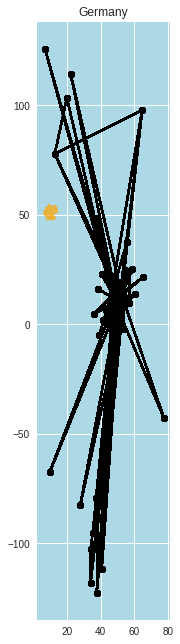

In [30]:

import matplotlib.pyplot as plt
plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 11]
fig, ax = plt.subplots()

map_df.plot(ax=ax, color='orange', alpha=0.8)

for index, loc in df_coord.iterrows():
    
    # Plot city location centroid.
    ax.plot(
        df_coord['lat'], 
        df_coord['lon'], 
        marker='o',
        c='black', 
        alpha=0.5
    )

ax.set(
    title='Germany', 
    aspect=1.3, 
    facecolor='lightblue'
);


#Extract coords
lat = df_coord['lat'].values
lon = df_coord['lon'].values


plt.show()

In [2]:
df_coord = pd.read_csv('analysis/locations.csv')  

In [3]:
df_coord

,Unnamed: 0,lat,lon
0,0,51.163087,13.470494
1,1,51.083420,10.423447
2,2,53.550341,10.000654
3,3,39.326234,-4.838065
4,4,51.083420,10.423447
...,...,...,...
26340,26340,49.617928,9.177370
26341,26341,50.105500,8.761070
26342,26342,46.616728,13.850027
26343,26343,51.507322,-0.127647


In [51]:
nom = Nominatim(user_agent="spat_tweet_ana")

location = nom.reverse([df_coord.loc[3, 'lat'], df_coord.loc[3, 'lon']])
location.raw['address']['country']

'España'

/home/katharina/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  # Remove the CWD from sys.path while we load stuff.


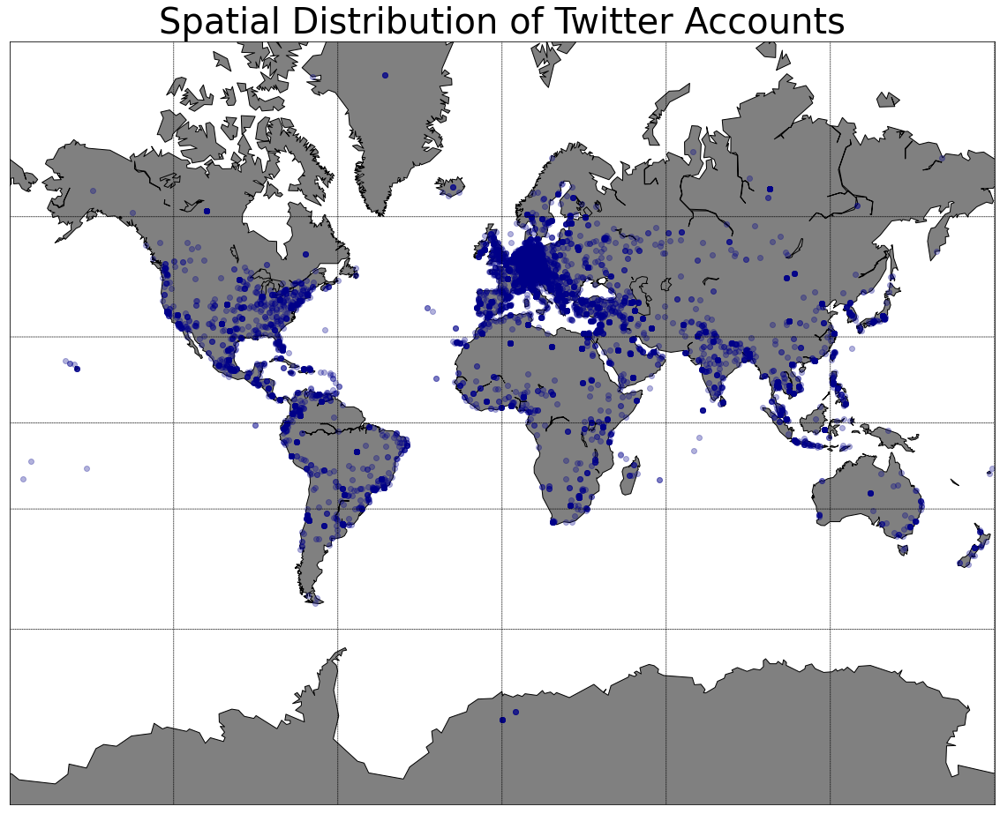

In [10]:
# visualization spatial analysis

#Extract coords
lat = df_coord['lat'].values
lon = df_coord['lon'].values

# 1. map background global
plt.figure(figsize=(20,20))
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
m.drawcoastlines()
m.fillcontinents(color='grey',lake_color='grey', zorder=1)
# draw parallels and meridians.
m.drawparallels(np.arange(-90.,91.,30.))
m.drawmeridians(np.arange(-180.,181.,60.))
#m.drawmapboundary(fill_color='navy', zorder= 0)


# 2. scatter tweet data
m.scatter(lon, lat, latlon=True, color='darkblue', alpha=0.3, zorder=2)

plt.title(label="Spatial Distribution of Twitter Accounts", 
          fontsize=40)
plt.show()

In [8]:
user_ids

{896838633784606720,
 720167388386164736,
 800727220092141570,
 803806683730280449,
 899655126377299968,
 899190154425794560,
 854267160893325312,
 853207812981129216,
 785782474315923456,
 701754501485559808,
 759726032345628673,
 847701481989865474,
 893259699562217476,
 900961140565344260,
 854720605702062086,
 123994138,
 987234332,
 4686086174,
 1370226720,
 24903713,
 23855142,
 773776952872370176,
 1320943670,
 3532390457,
 201064510,
 3496476736,
 4022861889,
 949612162246479872,
 58982469,
 725040757380419584,
 1268632673565671424,
 3429630028,
 854217206229499904,
 810908283229900800,
 3324772431,
 2287206481,
 735444999974883329,
 2182086756,
 968157268209491968,
 1854144626,
 978641907369873408,
 1057342079188324352,
 1183441279616798720,
 973449075701043200,
 700973207,
 3024879767,
 2571108509,
 3033530529,
 82837669,
 811016256291803140,
 89129139,
 335544510,
 960108322916634624,
 2251555020,
 1045109814437793792,
 2759065816,
 3239837915,
 336593130,
 4770496762,
 1153

In [ ]:
#additional information
hashtag_dict = {}
retweets = {}
qanon = {}
hnerds = {}
fakenews = {}
for auth in range(8):
    print(f'Auth: {auth}')
    for part in range(1, 40):
        print(f'Part {part}')
        try:
            with open(f'tweets/1_tweets_auth{auth}_ckpt{part}.json') as json_file:
                tmp_tweets = json.load(json_file)
                print('Loaded')

            #print(tweet_keys)
            for user in tmp_tweets:
                #print(user)
                tweets = tmp_tweets[user]
                #print(len(tweets))
                for tweet_id in tweets:
                    tweet = tweets[tweet_id]
                     #print(tweet)
                    for annot in tweet['entities']['user_mentions']:
                        if annot['id'] in user_ids:
                            edge = {}
                            edge['tweet'] = tweet['id']
                            edge['sender'] = tweet['user']['id']
                            edge['receiver'] = annot['id']
                                
                            if tweet['user']['id'] in retweets:
                                tweet_list = retweets[tweet['user']['id']] 
                                tweet_list.append(edge)
                                retweets[tweet['user']['id']] = tweet_list
                            else:
                                retweets[tweet['user']['id']] = [edge]
                
                    if tweet['retweeted_status'] != False:
                        try:
                            user_id = tweet['retweeted_status']['user']['id'] 
                            edge = {}
                            edge['tweet'] = tweet['id']
                            edge['sender'] = tweet['user']['id']
                            edge['receiver'] = user_id

                            if tweet['user']['id'] in retweets:
                                tweet_list = retweets[tweet['user']['id']] 
                                tweet_list.append(edge)
                                retweets[tweet['user']['id']] = tweet_list
                            else:
                                retweets[tweet['user']['id']] = [edge]
                        except:
                            print()
                    #extract all hashtags                          
                    #hashtags = tweet['entities']['hashtags']
                    #for tag in hashtags:
                    #   #print(tag['text'])
                    #    if tag['text'].lower() == 'qanon' or tag['text'].lower() == 'wwg1wga':
                    #        qanon[tweet_id] = tweet
                    #    if tag['text'].lower() == '12hnerds':
                    #        hnerds[tweet_id] = tweet
                    #    if tag['text'].lower() == 'fakenews':
                    #        fakenews[tweet_id] = tweet
                    #        
                    #    if tag['text'].lower() in hashtag_dict:
                    #        count = hashtag_dict[tag['text'].lower()]
                    #        hashtag_dict[tag['text'].lower()] = count + 1
                    #    else:
                    #        hashtag_dict[tag['text'].lower()] = 1
        
        except:
            print(f"Skip Part {part}")


Auth: 0
Part 1


In [6]:
text_file = open("analysis/high_indeg_names.txt", "r")
high_indeg_names = text_file.readlines()
len(high_indeg_names)

706

In [ ]:
#additional information
tweet_list = []
for auth in range(8):
    print(f'Auth: {auth}')
    for part in range(1, 40):
        print(f'Part {part}')
        try:
            with open(f'tweets/1_tweets_auth{auth}_ckpt{part}.json') as json_file:
                tmp_tweets = json.load(json_file)
                print('Loaded')

            print(tmp_tweets)
            for user in tmp_tweets:
                print(user)
                raise
                if user not in high_indeg_names:
                    continue
                print(user)
                tweets = tmp_tweets[user]
                for tweet_id in tweets:
                    tweet_list.append(tweets[tweet_id])
                    break
                     
        
        except:
            print(f"Skip Part {part}")


Auth: 0
Part 1


In [174]:
print(qanon.keys())
qanon['1287861954086932482']

NameError: name 'qanon' is not defined

In [ ]:
with open(f'analysis/retweet.json') as json_file:
    json.dump(retweets, json_file)    
with open(f'analysis/qanon.json') as json_file:
    json.dump(qanon, json_file)  
with open(f'analysis/hnerds.json') as json_file:
    json.dump(hnerds, json_file)  
with open(f'analysis/fakenews.json') as json_file:
    json.dump(fakenews, json_file)  

In [175]:
with open(f'analysis/qanon.json') as json_file:
    qanon = json.load(json_file)  
    
#with open(f'analysis/fakenews.json') as json_file:
#    fakenews = json.load(json_file)  

In [183]:
print(len(qanon.keys()))
qanon_authors = []

for tweet_id in qanon.keys():
    tweet = qanon[tweet_id]
    qanon_authors.append(tweet['user']['id'])
    
len(set(qanon_authors))

26848


2510

In [184]:
with open(f'analysis/locations.json') as json_file:
    locations = json.load(json_file)  
    
#with open(

no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc availab

no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc availab

no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc availab

no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc available
no loc availab

/home/katharina/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]


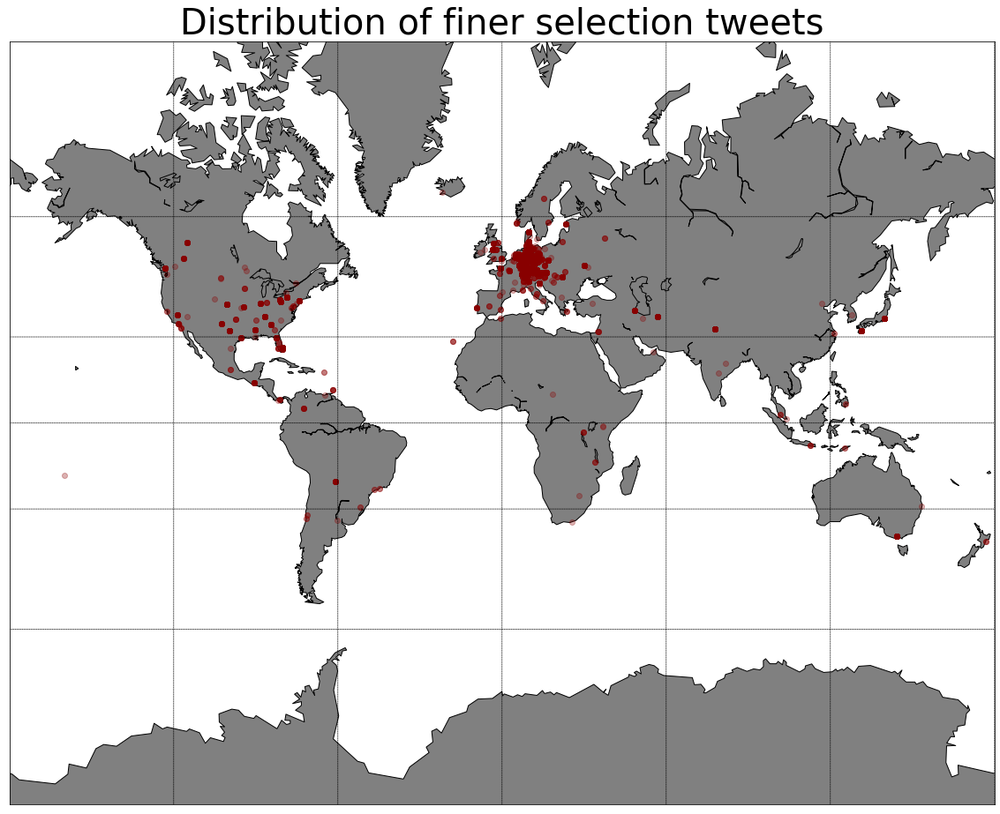

In [187]:
lon = []
lat = []
for user_id in qanon_authors:
    try:
        lon.append(locations[str(user_id)]['lon'])
        lat.append(locations[str(user_id)]['lat'])
    except:
        print('no loc available')
        
# 1. map background global
plt.figure(figsize=(20,20))
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
m.drawcoastlines()
m.fillcontinents(color='grey',lake_color='grey', zorder=1)
# draw parallels and meridians.
m.drawparallels(np.arange(-90.,91.,30.))
m.drawmeridians(np.arange(-180.,181.,60.))
#m.drawmapboundary(fill_color='navy', zorder= 0)


# 2. scatter tweet data
m.scatter(lon, lat, latlon=True, color='darkred', alpha=0.3, zorder=2)

plt.title(label="Distribution of finer selection tweets", 
          fontsize=40)
plt.show()

In [188]:
hashtags = pd.read_csv('analysis/hashtags.csv')

In [213]:
consp_5g = []
consp_chemtrails = []
consp_gates = []
consp_biological = []
consp_chinese = []
consp_military = []
consp_gmo = []
consp_deepState = []
consp_pharma = []
consp_hospital = []
for index, tag in hashtags.iterrows():
    if '5g' in str(tag['tag']):
        consp_5g.append(tag)
    if 'gates' in  str(tag['tag']):
        consp_gates.append(tag)
    if 'chemtrails' in  str(tag['tag']):
        consp_chemtrails.append(tag)
    if 'weapon' in  str(tag['tag']):
        consp_biological.append(tag)
    if 'chinese' in  str(tag['tag']):
        consp_chinese.append(tag)
    if 'military' in  str(tag['tag']):
        consp_military.append(tag)
    if 'gmo' in  str(tag['tag']):
        consp_gmo.append(tag)
    if 'deepstate' in  str(tag['tag']):
        consp_deepState.append(tag)
    if 'pharma' in  str(tag['tag']):
        consp_pharma.append(tag)
    if 'filmyourhospital' in  str(tag['tag']):
        consp_hospital.append(tag)

In [211]:
consp_biological

[Unnamed: 0        1234
 tag           biomassa
 count              144
 Name: 1234, dtype: object, Unnamed: 0                1337
 tag           biomassacentrale
 count                       24
 Name: 1337, dtype: object, Unnamed: 0                 1616
 tag           biomassacentrales
 count                        25
 Name: 1616, dtype: object, Unnamed: 0              1883
 tag           biodiversiteit
 count                      9
 Name: 1883, dtype: object, Unnamed: 0           2258
 tag           biocentrale
 count                   1
 Name: 2258, dtype: object, Unnamed: 0         2322
 tag           biodiesel
 count               128
 Name: 2322, dtype: object, Unnamed: 0              2391
 tag           biomassaketels
 count                      2
 Name: 2391, dtype: object, Unnamed: 0                3110
 tag           bioshockinfinite
 count                        7
 Name: 3110, dtype: object, Unnamed: 0        3114
 tag           bioshock
 count               26
 Name: 3114, 

4992
2576
12226
1049
2223
1634
1435
5327
4220
98
                 tag    count
0                 5G   4992.0
1         ChemTrails   2576.0
2         Bill Gates  12226.0
3  Biological Weapon   1049.0
4              China   2223.0
5           Military   1634.0
6         Deep State   5327.0
7             Pharma   4220.0
8   FilmYourHospital     98.0


([<matplotlib.axis.XTick at 0x7f1b154a0110>,
 [Text(0, 0, '5G'),
  Text(0, 0, 'ChemTrails'),
  Text(0, 0, 'Bill Gates'),
  Text(0, 0, 'Biological Weapon'),
  Text(0, 0, 'China'),
  Text(0, 0, 'Military'),
  Text(0, 0, 'Deep State'),
  Text(0, 0, 'Pharma'),
  Text(0, 0, 'FilmYourHospital')])

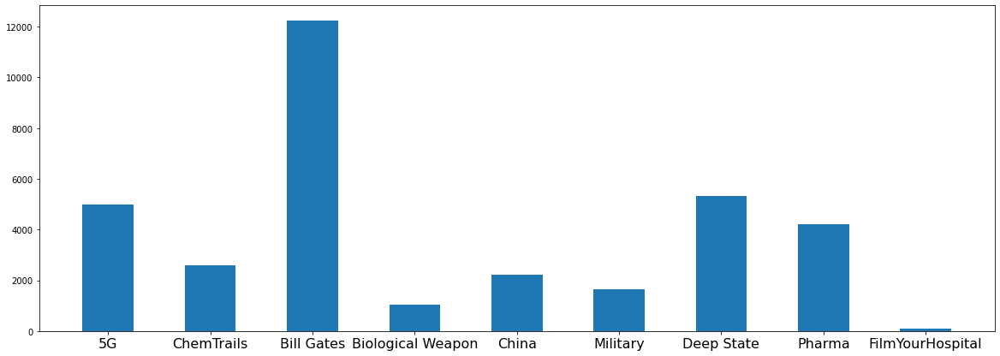

In [214]:
df_consp_5g = pd.DataFrame(consp_5g)
print(df_consp_5g['count'].sum(axis=0))
df_consp_chemtrails = pd.DataFrame(consp_chemtrails)
print(df_consp_chemtrails['count'].sum(axis=0))
df_consp_gates = pd.DataFrame(consp_gates)
print(df_consp_gates['count'].sum(axis=0))

df_consp_biological = pd.DataFrame(consp_biological)
print(df_consp_biological['count'].sum(axis=0))

df_consp_chinese = pd.DataFrame(consp_chinese)
print(df_consp_chinese['count'].sum(axis=0))

df_consp_military = pd.DataFrame(consp_military)
print(df_consp_military['count'].sum(axis=0))

df_consp_gmo = pd.DataFrame(consp_gmo)
print(df_consp_gmo['count'].sum(axis=0))

df_consp_deepState = pd.DataFrame(consp_deepState)
print(df_consp_deepState['count'].sum(axis=0))

df_consp_pharma = pd.DataFrame(consp_pharma)
print(df_consp_pharma['count'].sum(axis=0))

df_consp_hospital = pd.DataFrame(consp_hospital)
print(df_consp_hospital['count'].sum(axis=0))

df_consp_theories = pd.DataFrame()
df_consp_theories.loc[0, 'tag'] = '5G'
df_consp_theories.loc[0, 'count'] = df_consp_5g['count'].sum(axis=0)
df_consp_theories.loc[1, 'tag'] = 'ChemTrails'
df_consp_theories.loc[1, 'count'] = df_consp_chemtrails['count'].sum(axis=0)
df_consp_theories.loc[2, 'tag'] = 'Bill Gates'
df_consp_theories.loc[2, 'count'] = df_consp_gates['count'].sum(axis=0)

df_consp_theories.loc[3, 'tag'] = 'Biological Weapon'
df_consp_theories.loc[3, 'count'] = df_consp_biological['count'].sum(axis=0)

df_consp_theories.loc[4, 'tag'] = 'China'
df_consp_theories.loc[4, 'count'] = df_consp_chinese['count'].sum(axis=0)

df_consp_theories.loc[5, 'tag'] = 'Military'
df_consp_theories.loc[5, 'count'] = df_consp_military['count'].sum(axis=0)

df_consp_theories.loc[6, 'tag'] = 'Deep State'
df_consp_theories.loc[6, 'count'] = df_consp_deepState['count'].sum(axis=0)

df_consp_theories.loc[7, 'tag'] = 'Pharma'
df_consp_theories.loc[7, 'count'] = df_consp_pharma['count'].sum(axis=0)

df_consp_theories.loc[8, 'tag'] = 'FilmYourHospital'
df_consp_theories.loc[8, 'count'] = df_consp_hospital['count'].sum(axis=0)

plt.figure(figsize=(20,7))
print(df_consp_theories)
ax = plt.bar(range(len(df_consp_theories['tag'])), df_consp_theories['count'],  width=0.5)
plt.xticks(range(len(df_consp_theories['tag'])), list(df_consp_theories['tag']), fontsize=16)


In [199]:
consp_gates

[Unnamed: 0        2758
 tag           fckgates
 count               11
 Name: 2758, dtype: object, Unnamed: 0     2759
 tag           gates
 count          2929
 Name: 2759, dtype: object, Unnamed: 0         2760
 tag           billgates
 count              4328
 Name: 2760, dtype: object, Unnamed: 0                 10412
 tag           haltdiefressegates
 count                          1
 Name: 10412, dtype: object, Unnamed: 0                  10532
 tag           gibgateskeinechance
 count                        1174
 Name: 10532, dtype: object, Unnamed: 0              11737
 tag           gatesfoundation
 count                     427
 Name: 11737, dtype: object, Unnamed: 0              13499
 tag           exposebillgates
 count                     313
 Name: 13499, dtype: object, Unnamed: 0                    14889
 tag           billgatesbioterrorist
 count                           142
 Name: 14889, dtype: object, Unnamed: 0          14925
 tag           gatesofhell
 count     

In [171]:
impf = []
for index, tag in hashtags.iterrows():
    if 'impf' in str(tag['tag']):
        impf.append(tag)

       Unnamed: 0                  tag  count
3471         3471            impfstoff   3548
2643         2643          impfpflicht   2494
3506         3506              impfung   2490
10149       10149        zwangsimpfung   1277
2642         2642            impfzwang   1215
10215       10215               impfen    790
15069       15069           impfgegner    421
10383       10383            impfungen    359
19326       19326           impfstoffe    250
15803       15803        grippeimpfung    181
19390       19390      zwangsimpfungen    162
8758         8758  grippeschutzimpfung    155
21875       21875          impfstoffen    138
       Unnamed: 0                  tag  count
3471         3471            impfstoff   3548
2643         2643          impfpflicht   2494
3506         3506              impfung   2490
10149       10149        zwangsimpfung   1277
2642         2642            impfzwang   1215
10215       10215               impfen    790
15069       15069           impfge

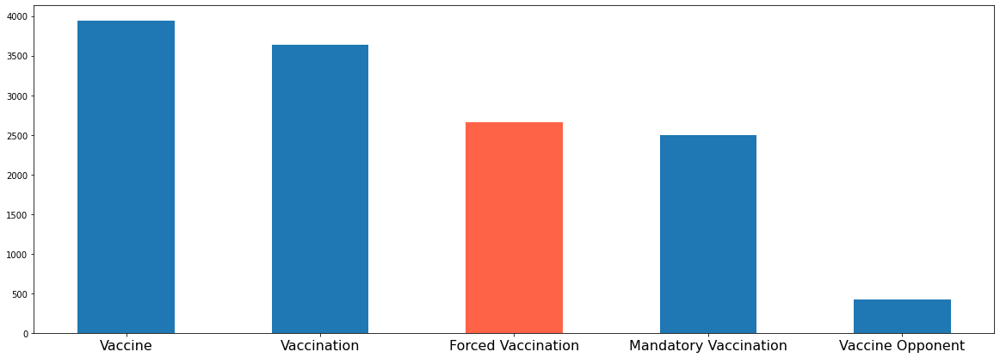

In [173]:

plt.figure(figsize=(20,7))
df_impf = pd.DataFrame(impf)
df_impf = df_impf.loc[df_impf['count'] >100]
df_impf = df_impf.sort_values(by=['count'], ascending=False)
print(df_impf)

df_impf_plot = pd.DataFrame()
df_impf_plot.loc[0, 'tag'] = 'Vaccine'
df_impf_plot.loc[0, 'count'] = df_impf.loc[3471, 'count'] + df_impf.loc[21875, 'count'] + df_impf.loc[19326, 'count']
df_impf_plot.loc[1, 'tag'] = 'Mandatory Vaccination'
df_impf_plot.loc[1, 'count'] = df_impf.loc[2643, 'count']
df_impf_plot.loc[2, 'tag'] = 'Forced Vaccination'
df_impf_plot.loc[2, 'count'] = df_impf.loc[10149, 'count'] + df_impf.loc[2642, 'count'] + df_impf.loc[19390, 'count']
df_impf_plot.loc[3, 'tag'] = 'Vaccine Opponent'
df_impf_plot.loc[3, 'count'] = df_impf.loc[15069, 'count']
df_impf_plot.loc[4, 'tag'] = 'Vaccination'
df_impf_plot.loc[4, 'count'] = df_impf.loc[3506, 'count'] + df_impf.loc[10215, 'count'] + df_impf.loc[10383, 'count']
df_impf_plot = df_impf_plot.sort_values(by=['count'], ascending=False)
ax = plt.bar(range(len(df_impf_plot['tag'])), df_impf_plot['count'],  width=0.5)
print(df_impf)
plt.xticks(range(len(df_impf_plot['tag'])), list(df_impf_plot['tag']), fontsize=16)
ax.patches[2].set_facecolor('#FF6347')

In [35]:
fakenews.keys()

dict_keys(['1315387462383005696', '1298967237739642881', '1296081449590947840', '1277712028082278402', '1183386834790944768', '1305459012452921344', '1301802684144648192', '1301800376438599681', '1301771551327608837', '1277870612850106368', '1323994293380460547', '1323868781727358977', '1320604364755685377', '1319121993099333632', '1315898814453166081', '1306095813593051136', '1305813544479395840', '1305717116595769345', '1305410504622567424', '1304796285522903040', '1304480539529838593', '1303968327795118080', '1303401626821160960', '1303399067351949313', '1303383805634514945', '1301233853575630848', '1300527373490757636', '1299815035322150913', '1241062905187090434', '1240656750862311425', '1318132581989318656', '1317987345992437760', '1317008090131292160', '1316991550497370114', '1316889380510892032', '1251524491974447105', '1322191265082068994', '1322133689128595456', '1318319331332284416', '819600391541231617', '809664870895484928', '1324231986089762822', '1322059894271447048', '1

In [36]:
fakenews['1286899569540976640']

{'created_at': 'Sat Jul 25 05:42:21 +0000 2020',
 'id': 1286899569540976640,
 'id_str': '1286899569540976640',
 'full_text': '@Nasirea1 @Akishita2 @Andre1234 Immer #positiv sein! 😁\n\n#Impfzwang #Impfung #Impfschäden #mRNA #Corona #Covid19 #Marketing #Regierung #Politik #Diktatur #ID2020 #FakeNews #Dystopie #Zensur #Propaganda #GEZ-Medien #Lobbyismus #WHO cares https://t.co/JQmCfDz8B1',
 'truncated': False,
 'display_text_range': [32, 235],
 'entities': {'hashtags': [{'text': 'positiv', 'indices': [38, 46]},
   {'text': 'Impfzwang', 'indices': [56, 66]},
   {'text': 'Impfung', 'indices': [67, 75]},
   {'text': 'Impfschäden', 'indices': [76, 88]},
   {'text': 'mRNA', 'indices': [89, 94]},
   {'text': 'Corona', 'indices': [95, 102]},
   {'text': 'Covid19', 'indices': [103, 111]},
   {'text': 'Marketing', 'indices': [112, 122]},
   {'text': 'Regierung', 'indices': [123, 133]},
   {'text': 'Politik', 'indices': [134, 142]},
   {'text': 'Diktatur', 'indices': [143, 152]},
   {'text': 'ID202

In [30]:
print(len(qanon.keys()))
qanon_authors = []

for tweet_id in qanon.keys():
    tweet = qanon[tweet_id]
    qanon_authors.append(tweet['user']['screen_name'])
    
len(set(qanon_authors))

26848


2510

In [5]:
with open(f'tweets/1_tweets_auth0_ckpt1.json') as json_file:
    tmp_tweets = json.load(json_file)               

In [9]:
hashtag_dict = {}
for user in tmp_tweets:
    #print(user)
    tweets = tmp_tweets[user]
    #print(len(tweets))
    for tweet_id in tweets:
        tweet = tweets[tweet_id]
        #extract all hashtags                          
        hashtags = tweet['entities']['hashtags']
        for tag in hashtags:
            #print(tag['text'])
            if tag['text'].lower() in hashtag_dict:
                count = hashtag_dict[tag['text'].lower()]
                hashtag_dict[tag['text'].lower()] = count + 1
            else:
                hashtag_dict[tag['text'].lower()] = 1

In [5]:
link_tweet = []
tweet_keys = list(tmp_tweets.keys())
hashtag_dict = {}
#print(tweet_keys)
for user in tmp_tweets:
    print(user)
    tweets = tmp_tweets[user]
    print(len(tweets))
    for tweet_id in tweets:
        
        #extract user mentions
        tweet = tweets[tweet_id]
        #print(tweet)
        for annot in tweet['entities']['user_mentions']:
            if annot['id'] in user_ids:
                edge = {}
                edge['tweet'] = tweet
                edge['sender'] = tweet['user']['id']
                edge['receiver'] = annot['id']
                link_tweet.append(edge)
        #extract all hashtags                          
        hashtags = tweet['entities']['hashtags']
        for tag in hashtags:
            print(tag['text'])
            if tag['text'].lower() in hashtag_dict:
                count = hashtag_dict[tag['text'].lower()]
                hashtag_dict[tag['text'].lower()] = count + 1
            else:
                hashtag_dict[tag['text'].lower()] = 1


milkaST2
0
JSpanedda
8
GerdHarry
316
Hefeklöße
oderfrucht
Lauterbach
Lauterbach
chelbi
TeamChebli
maskeauf
AfD
coronavirus
Frosta
Bobenheim
Roxheim
Coronavirus
ichwill
transformation
Corona
Merkel
Beherbergungsverbot
Bürger
coronavirus
livestream
Berlin
BILDLIVE
Räumung
Liebig34
Liebig34
Söder
Corona
bindeutschundkeinNazi
Merkel
CoronaQuartett
the
Chelbi
Panikioten
CoronaQuartett
AnneWill
Seelebaumelnlassen
WirHabenPlatz
IchHabePlatz
Deutschland
Allensbach
Masken
KarinaReiss
SucharitBhakdi
Interview
Thread
COVID19
LockdownOhneEffekt
AnneWill
Silvester
Polizei
Feuerwehr
Rettungsdiensten
Rückruf
copack
Glyhphosat
KATWARN
24hNurburgring
SPD
Martin
annewill
Stegner
BieriRene
11
BullDOK4
770
Biden
Minsk
Syrien
Idlib
Muc0111
Germany
Lockdown2
KaDeWe
Shutdown
Lockdown
HeuteShow
Aachen
luegenpresse
lockdown2
Kanzlerin
löschteuch
Söder
Merkel
fake
COVID19
Polizei
Ditfurth
lockdown
Unverletzlichkeit
Wohnung
Grundrecht
comment
ZeugenCoronas
fakepandemic
Lanz
dpa
ARD
ZDF
DLF
Nigeria
Lockdown
Mitsp

Lukashenko
Minsk
Belarus
protest
Scheveningen
Antifa
BlacklivesMatter
peiling
COLUMN
peiling
Omtzigt
deJonge
ΑLARABIYA
Lebanon
Turkish
Covid_19
teststraat
corona
China
Hegemonie
bevolkingsgroei
bevolking
migratie
vergrijzing
ontgroening
GGD
cultuur
Rotterdam
BergenopZoom
Gouda
biomassacentrale
onweerscellen
Coronavirus
Spanje
Nederland
SpanishGP
F1
Turkey
vakantie
bouwvak
Keurdokter
keuringen
manmanman
Covid_19
discipline
terugreizigers
corona
Turkije
Pakistan
NATO
EU
Greece
Turkey
Greece
Syria
Hmeimim
Russia
handhaving
Scheveningen
Sinabung
Indonesia
Sumatra
BREAKING
Volgograd
Rotterdam
Scheveningen
Feadsdhip
launched
Project706
Aalsmeer
GouwerokShipyard
COVID19
Hamburg
Coronavirus
peiling
Coronavirus
honden
geur
Blankenberge
Strand
parkeren
GGD
België
Scheveningen
Blankenberge
respect
strand
ontspanning
Beirut
Hezbollah
NPO
NPO
NOSjournaal
Beirut
Hezbollah
Lebanon
reisadvies
Hobbemaplein
DenHaag
Akwasi
stranden
N57
Wassenaar
VOL
parkeren
strand
ABNAmro
cultuur
CumEx
Covid_19
quaranta

Oberfranken
Iraker
BLM
Democrats
Drosten
ZDF
Corona
coronavirus
Spiegel
umweltschutz
revolution
Merkel
Bochum
Zeil
Frankfurt
NGO
Flüchtlinge
Lesbos
Bremen
Nürnberg
Dortmund
Mittelrheinliga
TordesJahres
mittelrheinliga
fvm
corona
Söder
Merkel
Antifa
Drosten
Wieler
Spahn
Merkel
Sozialismus
AfD
niemehrSozialismus
DistancingdasSinnmacht
Frankfurt
Corona
Kurzarbeit
Kurzarbeit
Halle
LasVegas
Langen
Fotofahndung
Karlsruhe
Restaurant
Video
Corona
Moria
Flüchtlinge
Polizei
NRW
PolizeiNRW
Morges
Moria
MORIABRENNT
Migranten
Migrationspakt
MigrationEU
Deutschland
Syrien
Köln
Fotofahndung
Dresden
Messer
Bielefeld
Tuttlingen
Messer
SaschaLobo
Covid19
Moria
kinderrechte
Moria
Merkel
Viren
Corona
Coronakrise
coronavirus
bhakdi
TEILEN
lanz
Somunco
lanz
NGO
Maenner
Samos
goeringeckardt
Samos
Griechenland
Lesbos
Deutschland
Moria
AfD
KommunalwahlNRW
Corona
COVID19
Belarus
Mainstream
Ireland
Dublin
CoronaDemo
Lockdown
AfD
Braunschweig
Köln
Reker
blockedbyradiofm4
Nawalny
Nowitschok
Roth
BREAKING
Ankara
Tu

Pandemie
Journalismus
Querdenken
Meinung
Journalismus
querdenken
Covid_19
Angst
Querdenken
Meditation
Geist
Berlin
spreadhappiness
happinessproject
daskannstduauch
Missbrauch
Querdenken
Dauerstress
Krankheitssymptome
Immunsystem
Selbstheilungskräfte
Gesundheit
Buch
buchtipp
geilezeit
stressed
stressmanagement
glücklich
Gesundheit
coronavirus
depression
love
energy
change
Liebe
Corona
abcdpgc213
26
GodzWeedz
DankDude
TNBNaturalsSponsoredGrower
LoudAndProud
PeaceLoveAndHippieBeadz
MakeCloudz
Stoner
freedom
MNSistEhrensache
wirsindmehr
NeuesProfilfoto
Nachrichten
Heimat
Brate
Deutschland
krank
LegalizeIt
FickPolitik
LegalizeIt
Gzuz
FataMorgana
GuckMichUm
Mehrheit2020
CannabisFakten
MachDichSchlau
MachDichSchlauBeimDHV
Cannabis
Rastaman
German
DamianMarley
ItWasWritten
patience
demuja
Dj
Schalke04
Kimmich
changemymind
LegalizeIt
LegalisierungJetzt
aaydoganhotmai1
0
frauvonheinz
20
Kurt90504587
0
ChoiHancheol1
0
ayasoftghanacom
327
wordpresssucks
20yearsofcode
Google
Google
Google
Ghana
mus

hearingaid
CitizenScience
28c3
HearingAid
Hearable
Galerie
Photo
Gemälde
Videos
Dia
Berlin
Kunst
Berlin
Streetart
CoronaPandemie
Brasilien
freifunk
Coronakrise
Menschenrecht
Landeselternausschuss
Berlin
Homeschooling
Homeschooling
Coronakrise
Datenschutz
Kinderschutz
Petition
DigitaleSchuleCorona
Freifunk
Coronakrise
CNN
stayhome
staycalm
Coronakrise
Datenschutz
Kinderschutz
Petition
DigitaleSchuleCorona
Homeschooling
elearning
Coronakrise
Datenschutz
Kinderschutz
Petition
DigitaleSchuleCorona
Homeschooling
elearning
Coronakrise
Datenschutz
Kinderschutz
Petition
DigitaleSchuleCorona
Homeschooling
elearning
Coronakrise
Petition
DigitaleSchuleCorona
Homeschooling
elearning
Datenschutz
Covid19
systemrelevanten
Stayhome
machSauerteig
backBrot
Berlin
developers
Corona
FreieSzene
Kunst
jitsi
lockdownindia
CoronaPandemie
SocialDistancing
stayhome
machSauerteig
BackBrot
SocialDistancing
stayhome
machSauerteig
BackBrot
Stadttauben
Corona
ZuhauseBleiben
stayhome
machsauerteig
backbrot
COVID19
Er

Bonn
Hennef
Brillenpinguine
Gelsenkirchen
Pinguine
BREAKING
Iran
US
MieseMasche
Trickbetrug
DPolGHH
Wendt
Dresden
Coronavirus
FightingFriday
DYK
Deutschlandfunk
Essen
Rumänin
wdr
Biden
China
Ukraine
Corona
Neugeborene
Australien
Twitter
JackAss
Hamburg
Köln
Reker
Paritätsgesetz
sputnikdeutschland
Telegram
Kreml
sputnikdeutschland
LazyLeaf
LazyLeaf
NZZ
Köln
Facebook
Twitter
Google
Zensur
2020Debates
PresidentialDebate2020
Debates2020
Merkel
CDU
PeterTauber
Migration
Live
Biden
Trump
Antifa
CCP
Taiwan
SamuelPaty
LincolnProject
Corona
Hotspots
Brandenburg
Beherbergungsverbot
Ukraine
Krim
Sputnik_Kommentar
Merkel
TiergartenMord
Changoschwili
sputnikdeutschland
Biden
Polizei
Grünen
Elektroauto
ElectricCars
Facebook
Twitter
Zensur
Zuckerberg
Dorsey
JackAss
Dresden
Karatepe
Kamtschatka
Massensterben
Umwelt
Klima
SouthChinaSea
USSJohnSMcCain
FreeAndOpenINdoPacific
Obamagate
NordStream2
Sputnik_Kommentar
Polizei
Parodie
WDR
Klüngel
Vatikan
Petersdom
Ufos
Paris
Vimeo
Zensur
Türkei
Griechenland
Z

FBPE
HeyMP
Recycle
CharlieTheBrave
MagicMeghan
hedgehogs
CharlieTheBrave
care2
care2
care2
PobLwcCymru
CymruAmByth
ComeOnWales
Foxes
SaveTheSwifts
SaveOurEnvironment
FutureGeenerations
ProtectOurEnvironment
FutureGenerations
PeterKyle
HoveMP
Solution
Labour
Brexit
BetterDealforAnimals
Cardi
hedgehogs
NoHarmToAnimals
ProtectAllWildlife
kakapo2019
conservation
DogRescue
HumanChainOfLove
SwanStuckInTheIce
justsponsored
ForOurWildlife
Hero
BrightonCommunityNightShelter
LostBoxerPuppy
LetThePeopleDecide
ThereIsNoExcuseForAnimalAbuse
Birdsong
Winterwatch
SoundOn
ForTheLoveOfDonkeys
BabyBears
Orphans
AllLivesMatter
PuppyLove
FindFudge
NoNoNo
AmnestyUk
HelpFindLuna
DogLostUk
PowerOfMicrochipping
Reunited
FindRoxy
PanAm103
SaveAskhamBog
easyfundraising
StopShootingOurSwans
SaveTheKitties
Hedgehogs
HedgehogHighway
HarrysLastStand
brexitquiz
Remain
PlasticFree
BrightonAndHove
IChangeTheWorld
Care4Cats
NoPalmOilChristmas
SaveTheOrangutans
StopTheSlaughter
DitchThePlasticRings
SaveOurWildlife
SaveO

EPhearings2014
EPhearings2014
EPhearings2014
EPhearings2014
STOPCanete
tweet4taiji
tweet4dolphins
tweet4taiji
tweet4taiji
tweet4taiji
OpInfinitePatience
tweet4taiji
OpInfinitePatience
tweet4taiji
tweet4taiji
OpInfinitePatience
tweet4taiji
tweet4taiji
Blackfish
Tweet4Taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
OpKillingBay
TheCove
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
TheCove
tweet4taiji
tweet4taiji
tweet4taiji
DolphinProject
tweet4taiji
TheCove
reportthisatrocity
reportthisatrocity
DolphinProject
tweet4taiji
tweet4taiji
DolphinProject
NeverBeSilent
SeaShepherd
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
needanime
tweet4taiji
opkillingbay
tweet4taiji
tweet4taiji
helpmeout
tweet4taiji
tweet4taiji
tweet4taiji
tweet4taiji
OpKillingBay
tweet4t

berlinmitte
brandenburgerturm
fernsehturm
kicks
embassy
chineseembassy
wheredoesthisdoorgo
door
spree
jannowitzbrücke
sunrise
onthewaytowork
iphoneonly
panoramapunkt
flatwhite
coffee
fernsehturm
karlmarxallee
eating
jewish
foodporn
kollwitzplatz
sharingiscaring
bookforest
nikeplus
Trailrunning
Teufelsberg
Coffeeporn
Flatwhite
coffee
PrenzlBerg
Musical
Motown
Theater
Kurfürstendamm
nikeplus
Turm
Luxemburg
Trier
Petrisberg
Trier
bvg
nordbahnhof
sbahn
Gesundbrunnen
schloss
charlottenburg
eisernunion
dfbpokal
union
fcunion
BlackMilk
netturner
Lido
nordbahnhof
ausgang
keyza
hhv
pay4goodmusic
suffdaddy
berlinmitte
westside
waiting
BLUECHIPS2
mayerhawthorne
wheredoesthisdoorgo
itneverfails
jayz
hova
witnessjayhova
mchg
mcwt
jigga
bestrapperalive
Witnessofjayhova
Landungsbruecken
hamburg
hafen
stpauli
insta_hamburg
hh
unilevel
building
hamburg
architecture
hamburg
stpauli
streetartist
freez
dresden
Pelican
Tierpark
ladygaga
ampya
sunrise
planetarium
Nordbahnhof
karaoke
mauerpark
ampya
myvideo


Berlin
Dresden
Chemnitz
Einzelfälle
Seehofer
Bild
Borken
Blitzdiebstahl
Gefährder
Steuerzahler
AfD
SPD
Covid_19
Bahnfahren
Altparteienpolitiker
DB
Altparteienstaat
Berlin
Dresden
Islamisten
Karatepe
Dresden
Menschenverachtung
Muslime
Lehrer
Enthauptung
Berlin
Polizei
Dresden
Abschiebestopp
Syrien
Masken
Maskenpflicht
Bielefeld
Seebrücke
Migranten
Europa
Sicherungsnetz
Lockdown
Lockdown
AfD
Bundestag
Stuttgart
AfD
Bundesregierung
DDR
Dresden
Merkel
Neukölln
Corona
COVID
Iran
SPD
GRÜNE
Bhakdi
COVID19de
MaiLab
GEZ
COVID19
Migranten
Italien
Quarantäneschiff
Busdorf
Islamistischer
MORD
Dresden
Medien
Politik
Bluttat
Syrers
Sachsen
AfD
Schäuble
Syrer
Dresden
Spahn
Corona
Frankreich
Islamisten
Spahn
Coronavirus
Merkels
Corona
Migranten
Gendern
Deutschland
ISIS
Dresden
Köln
gefaehrder
Dresden
FFF
Corona
Dresden
Gefährder
Enthauptung
Frankreich
Islamisten
Moschee
Dresden
Syrer
IS
Gefährder
NRW
Verfassungsschutz
Bundesregierung
Lockdown
SamuelPaty
Dortmund
Tschad
AfD
Dresden
AfD
FreieDemokratenW

Maßnahmen
Maskenpflicht
Corona
ChinaBitchBiden
TheGreatAwakeningWorldwide
bidon2020fail
Historiker
Ferguson
Intellektuellen
Maskenpflicht
B2510
Berlin2510
nichtohneuns
querdenken
ChinaGate
Chinazi
ChinaBitchBiden
Rautenstalin
SayNoToBillyBoy
SayNoToBillyBoy
Thread
TheMoreYouKnow
Vitamin
Covidhoax
EUreLetzteChance
FutureOfCAP
Corona
Soeder
Liebe
Liebe
Frieden
COVID19de
Maskenzwang
Impfung
Bayern
Ägypten
HaltDieFresseLauterbach
Chile
Altmeier
Angst
Drosten
Islamismus
Covid19
parisattack
parisbeheading
Paris
parisbeheading
PrayForParis
parisbeheading
Paris
Mohammed
Censorship
SocialCredit
WitchHunt
ZweiteWelle
CoronaVirusDE
Ischgl
Schwyz
DAVOS
TheGreatReset
WEF
Disrupt
Disruptor
FisaGate
FisaGate
Regeneron
FISAgate
FISAgate
Merkel
Corona
Drohnenaufnahmen
Loveland
Colorado
Section230
Russland
Luftwaffe
Atombombe
Drosten
HZI
Braunschweig
Drosten
Prof
Eugeniker
nudging
coronavirus
Seehofer
Lockdown
Nena
Wendler
DeutscheBank
TrumpPence2020
MAGA
Beherbungsverbot
BidenHarris2020
Trump
Russland


QANONWORLDWIDE
WWG1GWA
WWG1WGA_WORLDWIDE
freeyourmind
Obamagate
TheGreatAwkening
OUTOFSHADOWS
Obamagate
pizzagate
adrenocrome
TheGreatAwkening
Obamagate
wakeup
TheGreatAwkening
Obamagate
GreatAwakening
TransitionToGreatness
Obamagate
wakeup
Obamagate
pizzagate
Adrenochrome
OUTOFSHADOWS
Obamagate
pizzagate
Adrenochrome
OUTOFSHADOWS
Obamagate
pizzagate
Adrenochrome
EpsteinDidntKillHimself
wakeup
pandaeyes
pizzagate
Adrenochrome
WakeUpWorld
HappyBirthdayTrump
Paris
Antifa
TheGreatAwakening
FakeNewsMedia
FakeNews
lanz
GodWins
QANONWORLDWIDE
̷̧̢̼̤͈̼̫̋̾Q̸̼͔͕̗͚̟̉̄̄͝a̷̞̗̺̐̔̚ṇ̶̨̢̦͚͚̜͇̯̉̓̑̉̏͋̕͝ö̴̡̟̥͔̟̞̯̠̳́ͅṇ̵̫̭͔̈́̓͆̄̈́̋̈́̓͘͠
Mars
Lyon
PeacefulProtests
PeacefulProtests
PeacefulProtests
WakeUpAmerica
StopPoliceBrutality
AllLivesMattter
PeacefulProtests
stopracism
WWG1WGA
WWG1WGAWORLDWIDE
WWG1WGA
WWG1WGAWORLDWIDE
LamestreamMedia
WWG1WGA
WWG1WGAWORLDWIDE
AllLivesMattter
PeacefulProtests
WWG1WGA
WWG1WGAWORLDWIDE
Trump2020
AllLivesMattter
PeacefulProtests
WWG1WGA
WWG1WGAWORLDWIDE
stopracism
WakeUpWorl

BoycottGoodyear
SouthKorea
maskmandates
Merkel
Lignano
Flüchtlinge
NurembergCode
Gates
Africa
realDonaldTrump
MAGA2020
Berlin2908
MichaelObama
TwilightZone
Lukaschenko
WHO
Wirtschaft
Beyrouth
WakeUpPeople
wwg1wga
Fakenews
Corona
COVID19
örr
Saveourchildren
Hydroxycholoroquine
ArtForGitmo
erkenneMarxisten
NothingCanStopWhatIsComing
QAnon
QAnon
KamalaHarris
KamalaHarrisDestroyed
Trump2020
SaraSaysSo
MAGA2020
QAnon
QAnon
BidenVP
KamalaHarrisForVP
BidenHarris2020
Plattling
WakeUpAustria
WakeUpEurope
TheGreatAwaking
ElectionInfection
systemicmurder
CuomoKilledGrandma
wayfairchildtrafficking
Cabal
TheMoreYouKnow
Österreich
COVID__19
Impfung
NewsWars
MissingChild
BROOKHAVEN
Georgia
RayenBaldwin
maskless
faceless
Brigitt26472660
29
savethechildren
savethechildren
Birgit33289413
75
FallGardenTours
QPosts
Rumble
YouTube
Kenosha
SoyBrigade
SayHisName
NikolaTesla
JohnTrump
joytech
SaveTheChildrenWorldWide
RIP
BrittanyHill
Merkelgate
KAG
HONORnews
Giveaway
XMAS
HONORxmas
HONOR20Pro
HONORmyWorld
mel

vogelgriep
ontwikkeld
BirdFlu
AsiaVirus
BoycottChina
BoycottAsia
Change
FoodEnMass
WakeUpCall
exterminate
TheVoiceless
vaccin
H5N1
vogelgriep
ontwikkeld
BirdFlu
AsiaVirus
BoycottChina
BoycottAsia
Change
FoodEnMass
WakeUpCall
exterminate
TheVoiceless
vaccin
H5N1
vogelgriep
ontwikkeld
BirdFlu
AsiaVirus
BoycottChina
BoycottAsia
Change
FoodEnMass
WakeUpCall
Worldpress
Ban
useless
primitive
Traditional
Medicine
asia
china
Vietnam
thailand
Boycottchina
Boycottasia
Ban
WetMarkets
Yulin
Donkeys
TraditionalChineseMedicine
WakeUpCall
VOraad
Huisbezoek
leerlingen
ouders
familie
primitieve
thuisleer
JeSuisProf
JeSuisEnseignant
JeSuisSamuel
Cartoons
EU
ActNow
BeepBeep
MeepMeep
WakeUpCall
Cartoons
EU
cartoon
Rotterdam
WakeUpCall
Worldpress
Ban
USELESS
PRIMITIVE
TRADITIONAL
MEDICINE
asia
china
Vietnam
Thailand
Boycottchina
Boycottasia
MarketWatch
Ban
Primitive
WetMarkets
Yulin
dogs
WakeUpCall
avondklok
Koninkrijk
Eenheid
EU
Duh
WakeUpCall
possibilities
opportunities
Change
TheSystem
MailInBallot
Wake

StayAtHomeSaveLives
Falldefinition
stayathome
stayathome
stayathome
coronavirus
stayathome
Coronalage
stayathome
stayathome
stayathome
fundemie
stayathome
stayathome
stayathome
stayathome
stayathome
stayathome
Maskenpflicht
Maskenverweigerer
stayathome
stayathome
stayathome
stayathome
stayathome
stayathome
StaySafe
Wendler
stayathome
stayathome
Soeder
Staysafe
StayHome
Maskenpflicht
stayathome
AreYouKiddingMe
Democrats
stayathome
Maskenpflicht
maskenverweigerer
stayathome
Maskenpflicht
stayathome
stayathome
Maskenpflicht
Maskenverweigerer
stayathome
StaySafe
stayathome
Maskenpflicht
stayathome
StaySafe
Maskenpflicht
Maskenverweigerer
stayathome
stayathome
Maskenpflicht
Maskenverweigerer
StaySafe
stayathome
Maskenpflicht
StayAtHomeSaveLives
Maskenpflicht
stayathome
stayathome
Maskenpflicht
Maskenverweigerer
stayathome
Maskenpflicht
stayathome
stayathome
Maskenpflicht
stayathome
stayathome
Maskenpflicht
stayathome
Maskenpflicht
stayathome
Maskenpflicht
stayathome
DeepState
StayAtHomeSave

Neukölln
ElektroAuto
Ladestation
Followerpower
heuteShow
Meinungsfreiheit
FF16
JeSuisSamuel
Biden
Paris
CDU
Wertegemeinschaft
Hass
WhyILoveLevel5
DDR
DDR
Wahlfälschung
MAGA
MAGA
AmyConeyBarrett
Antifa
Wien
denvershooting
Idstein
JuLis
AfD
Umfragen
Skandale
Trump2020
VoteTrump2020ToSaveAmerica
Potus45
MAGA
JoeBiden
Dem
Konzernverantwortungsinitiative
KVI
SaveLevel5
WhyILoveLevel5
savelevel5
Deutschland
LockHimUp
L34
Kemmerich
Liebig34
ZDF
ARD
Trump2020
Liebig34
Liebig34
Drecksloch
Drecksloch
liebig34lebt
WirHabenPlatz
Liebig34
liebig34lebt
Liebig34
Liebig34
Drecksloch
liebig34
Deutschland
Moria
Trump
Briefwahl
Shithole
Liebig34
Liebig34
Liebig34
Liebig34
liebig34
Liebig34
antifaBLM
BAMF
Gruene
SPD
Linke
Migranten
Flüchtlinge
DemocratsAreDestroyingAmerica
WhereIsTrump
WinstonChurchill
Trump
ExtinctionRebellion
Sozialismus
WalterReedHospital
Migration
Griechenland
Spionage
Tagesschau
Hamburg
MakeCaliRedAgain
WeLoveYouTrump
Karl_Lauterbach
KarlLauterbach
DeutscheEinheit
Brandenburg
Regenbo

android
androidgames
gameinsight
android
androidgames
gameinsight
Android
Androidgames
Gameinsight
Gameinsight
Android
Androidgames
Gameinsight
Androidgames
Android
Gameinsight
Androidgames
Android
Androidgames
Gameinsight
Android
android
androidgames
gameinsight
Android
Gameinsight
Androidgames
Gameinsight
Android
Androidgames
Androidgames
Gameinsight
Android
Androidgames
Android
Gameinsight
Androidgames
Gameinsight
Android
android
androidgames
gameinsight
Androidgames
Gameinsight
Android
android
androidgames
gameinsight
Android
Gameinsight
Androidgames
Androidgames
Android
Gameinsight
Android
Gameinsight
Androidgames
Androidgames
Android
Gameinsight
Android
Androidgames
Gameinsight
Androidgames
Gameinsight
Android
android
androidgames
gameinsight
android
androidgames
gameinsight
Gameinsight
Androidgames
Android
android
androidgames
gameinsight
android
androidgames
gameinsight
android
androidgames
gameinsight
Androidgames
Android
Gameinsight
Gameinsight
Androidgames
Android
Android
Ga

H50
Tsitsernakaberd
RejectSerj
WorldHeritageDay
DidYouKnow
Italy
WorldHeritageSites
Geneve
Armenier
Genozid
ZRHmovements
Tg2
Switzerland
Armenia
EDA
Avgeek
Beobachter
NoBillag
Armenia
Eurovision
esc2018
Lisbon2018
tamarforesc2018
LufthansaBlue
ExploreTheNew
newlivery
instantané
simpson
sopi
southpigalle
boboland
PoisonAriAri
Paraguay
Brasilien
MapPorn
international
balance
Trump
Catalonia
Syria
Angola
Venezuela
BREAKING
MastersOfPasta
ad
Armenia
Yerevan
BAV
NZZ
SRG
ericgujer
BAMagic
Niki
avgeek
srfglobal
SRFglobal
armenia
parable
Airbus
A340
SBB
Beriev
censored
algorithm
Lamborghini
HuracanRWD
Yerevan
NoBillag
4Novembre
AltaredellaPatria
ForzeArmate
FrecceTricolori
avgeek
Puidgemont
Puigdemontalafuga
Catalonia
Catalan
Belgica
NoBillag
Feature
Armenien
Yerevan
MUC
TXL
HistoryOfairberlin
Forever39
airberlin
SRG
srf
Schweiz
SVP
NoBillag
wochenzeitung
Woz
ruediwidmercartoons
Erevan
Tamanian
Vaterschaftsurlaub
Glaciers
Labrador
B747
Alcatraz
sandrancisco
FleetWeekSF
Xavier
dpareporter
Baden

NeverForget
Syrer
Dresden
Dresden
RTL
Corona
Söder
Lockdown
Corona
Delmenhorst
SPD
Berliner
CharlieHebdo
Schweden
Kosten
Augsburg
Spahn
Gates
Impfstoff
RNA
DNA
Saarbrücken
Google
Trump
Paris
SamuelPaty
MSM
Fooked
Merkel
KaDeWe
BPK
Terror
HeikoMaas
Twittersperre
Karikaturen
Meinungsfreiheit
Zensur
Islamismus
Zivilcourage
Islam
Afghanistan
Flüchtlinge
Victorine
EndSARS
Islamismus
Kosten
Hamburg
Paris
Linksterror
Pforzheim
Göttingen
Velbert
Mailand
Migranten
Wahlfälschung
Clinton
Obama
CIA
FBI
Liebig34
Duisburg
Flüchtlinge
Trump
Syrien
Wendler
LauraMueller
Liebig34
DannenroederForst
A49
Polizei
Liebig34
Abschiebung
Deutschland
Moria
Wendler
Corona
DSDS
Berlin
Lepanto
links
Armenier
linke
Berlin
Liebig34
Rheinbad
Mainstream
Habeck
Verantwortungseigentum
DDR
Corona
Dresden
Trump
Corona
Islam
Hannover
MNS
Einzelfall
Wolfsburg
Clinton
Obama
Simpsons
Altersarmut
Islam
Kopfwindel
Kopftuch
Corona
Hamburg
WalkAway
Wallersdorf
Spionagefirma
Assange
Schweden
EUGH
Kitas
Personal
UlliNissen
Moria
Mig

fdp
cdu
europa
sicherheit
afd
kriegsverbrechen
dielinke
Konflik
Artsakh
Aserbaidschan
Streumuniton
Artskah
Shushi
Aserbaidschan
Aserbaidschan
Objekte
FactsAboutAzerbaijan
StopAzerbaijaniAggression
StopAliyev
StopErdoghan
ArtsahkStrong
PeaceForArmenians
armenianlivesmatter
StopAzerbaijaniAggression
ArmeniaAgainstTerrorism
Artsakhstrong
Armenia
Stoperdogan
StopAliyev
StopAzerbaijaniAggression
ArmeniaAgainstTerrorism
Artsakhstrong
Armenia
Stoperdogan
StopAliyev
factsaboutazerbaijan
StopAzerbaijaniAggression
ArmeniaAgainstTerrorism
Artsakhstrong
Armenia
Stoperdogan
StopAliyev
factsaboutazerbaijan
StopAzerbaijaniAggression
factsaboutazerbaijan
NKpeace
StopAzerbaijaniAggression
FactsAboutAzerbaijan
ArtsakhStrong
Հաղթելուենք
iamarmenian
FactsAboutAzerbaijan
StopAzerbaijaniAggression
ArmeniaAgainstTerrorism
Artsakhstrong
Armenia
Stoperdogan
StopAliyev
StopAzerbaijaniAggression
ArmeniaAgainstTerrorism
Artsakhstrong
Armenia
Stoperdogan
StopAliyev
ECHR
InterimMeasures
Turkey
Arstakh
Recht
Selbstb

Ei
Tierschutz
Mainz
pulseofeurope
armen_ha
136
TrumpForPresident
jesus
loveyourneightborasyourself
AskWLwikileaks
Jesus
cross
forgiveness
Redemption
Jakob47236820
13
zerosixneuf439
0
Kuestenhein
24
Regina40260633
3083
MaskenAb
Infektionsschutzgesetz
Bundesregierung
SPD
NRW
Worms
RheinlandPfalz
Telegram
Garmisch
Wien
terroranschlag
Nizza
Vienna
Wien
attentat
Fulda
Hessen
Deutschland
MerkelseiDank
PCRGATE
PCRTests
COVID19
maskeauf
maskeab
SamuelPaty
Nizza
Macron
CancelCulture
Nizza
Terror
Islam
Frankfurt
Polizei
Nigeria
Frankfurt
AfD
Joachim_Herrmann
Islamismus
München
Frauen
SpendeMenschlichkeit
Migranten
SchlepperNGOs
Covid19
Lauterbach
Wien
Paris
Nizza
Dresden
Asylbewerber
Dresden
Paris
Nizza
Islamofaschistische
Nizza
Asylbewerber
Islam
Nizza
Frankreich
Nizza
Christen
bayern
PCR
Köln
Maske
ÄrztefürAufklärung
WellenbrecherShutdown
PopUpLockdown
Lockdown
Chemnitz
Messer
Lockdown
Wathlingen
LockdownLight
Corona
Syrer
AnneWill
Bundesregierung
Berlin
Panikorchester
lauterbach
Alltagsmasken

In [15]:
len(hashtag_dict)
df_hashtags = pd.DataFrame()

df_hashtags['tag'] = hashtag_dict.keys()
df_hashtags['count'] =  hashtag_dict.values()

In [17]:
df_hashtags

,tag,count
0,hefeklöße,2
1,oderfrucht,1
2,lauterbach,6847
3,chelbi,3
4,teamchebli,82
...,...,...
1176465,coronajapan,1
1176466,grandparentsshould,1
1176467,nasokas,1
1176468,chinesemodel,1


In [1]:
hashtag_dict['12hnerds']

NameError: name 'hashtag_dict' is not defined

In [218]:
print(len(hashtags))
df_hashtags_pop = hashtags.loc[hashtags['count'] > 10000]
print(len(df_hashtags_pop))
df_hashtags_pop = df_hashtags_pop.sort_values(by=['count'], ascending=False)
df_hashtags_pop['tag'].values

1176470
127


array(['afd', 'corona', 'merkel', 'berlin', 'spd', 'deutschland',
       'coronavirus', 'covid19', 'trump', 'cdu', 'eu', 'usa', 'antifa',
       'ukraine', 'gameinsight', 'polizei', 'ard', 'hamburg', 'android',
       'zdf', 'islam', 'stuttgart', 'moria', 'androidgames', 'bundestag',
       'russland', 'lockdown', 'flüchtlinge', 'linke', 'dresden',
       'syrien', 'news', 'türkei', 'fdp', 'erdogan', 'syria', 'israel',
       'fakenews', 'grüne', 'iran', 'coronakrise', 'paris', 'csu', 'wien',
       'china', 'b2908', 'biden', 'maskenpflicht', 'putin', 'bitcoin',
       'frankfurt', 'europa', 'migranten', 'russia', 'covid_19', 'grünen',
       'annewill', 'seehofer', 'us', 'leipzig', 'pegida', 'demokratie',
       'covid', 'germany', 'qanon', 'groko', 'wwg1wga', 'assange',
       '12hnerds', 'chemnitz', 'blacklivesmatter', 'griechenland',
       'macron', 'spahn', 'münchen', 'köln', 'thüringen',
       'fridaysforfuture', 'brexit', 'nato', 'frankreich', 'politik',
       'turkey', 'nrw'

['afd', 'corona', 'merkel', 'berlin', 'spd', 'deutschland', 'coronavirus', 'covid19', 'trump', 'cdu', 'eu', 'usa', 'antifa']


AttributeError: module 'matplotlib.pyplot' has no attribute 'patches'

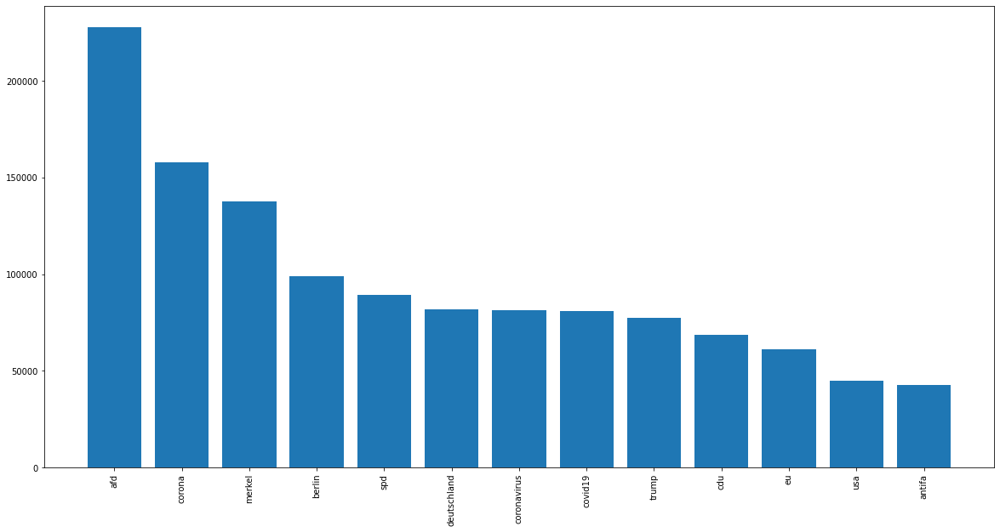

In [102]:
df_hashtags_pop = df_hashtags_pop.sort_values(by=['count'], ascending=False)
print(list(df_hashtags_pop['tag']))

plt.figure(figsize=(20,10))
plt.bar(range(len(df_hashtags_pop['tag'])), df_hashtags_pop['count'])
plt.xticks(range(len(df_hashtags_pop['tag'])), list(df_hashtags_pop['tag']), rotation=90)
plt.patches[df.index.get_indexer(['H'])[0]].set_facecolor('orange')
(range(len(df_hashtags_pop['tag'])), df_hashtags_pop['count'])

In [103]:
df_hashtags_pop.set_index('tag')
df_hashtags_pop.to_csv('analysis/top_hashtags.csv')

<Figure size 1440x504 with 0 Axes>

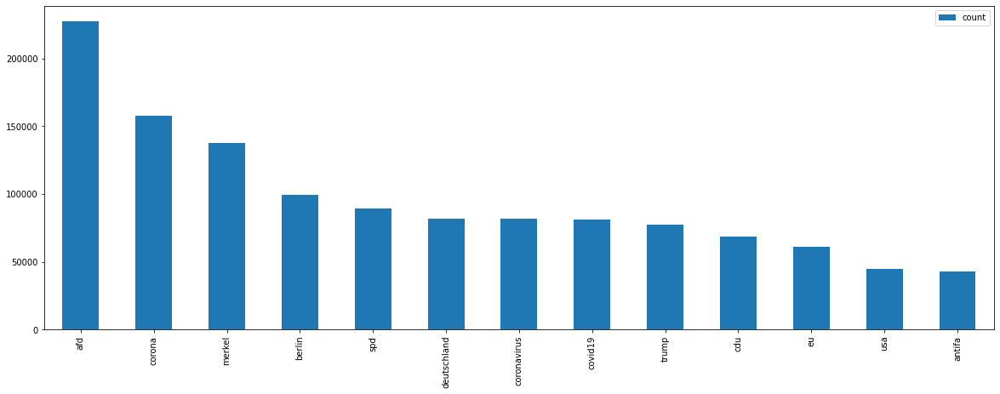

<Figure size 1440x504 with 0 Axes>

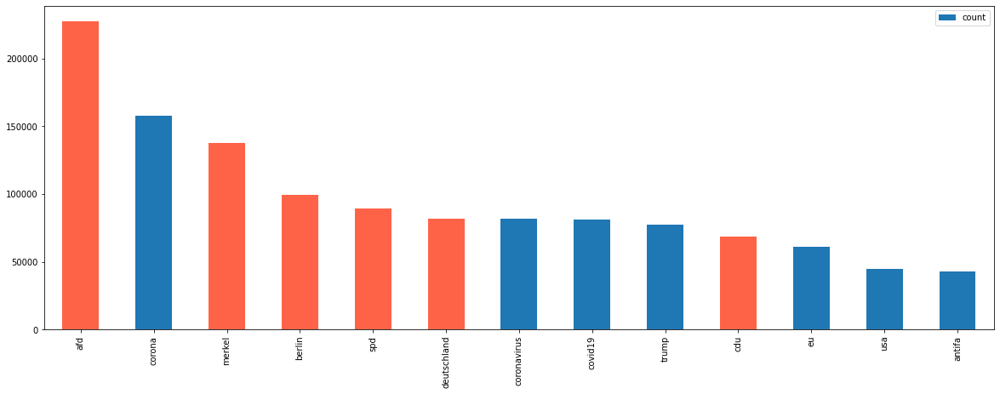

<Figure size 1440x504 with 0 Axes>

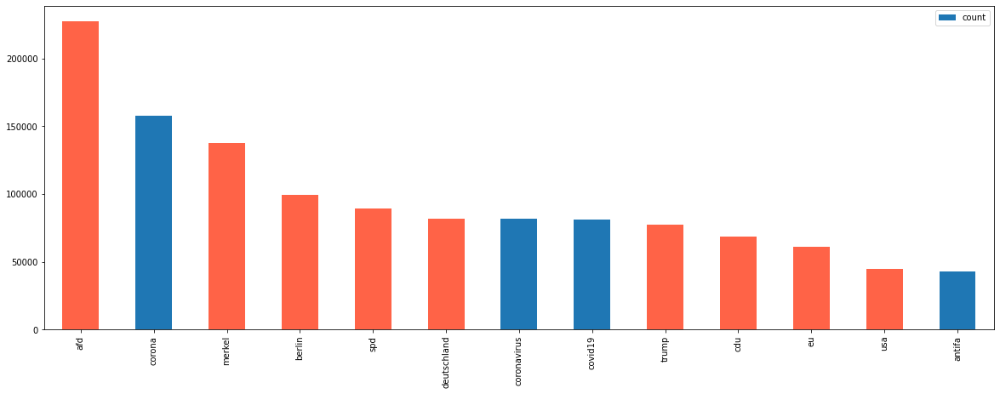

<Figure size 1440x504 with 0 Axes>

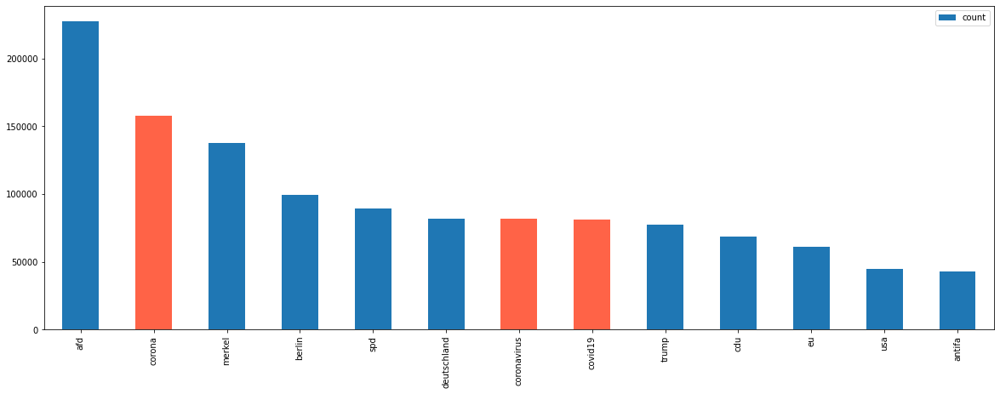

In [112]:
plt.figure(figsize=(20,7))
ax = df_hashtags_pop.plot.bar(x='tag', y='count', rot=90, figsize=(20,7))
ax.set_xlabel('')


plt.show()


plt.figure(figsize=(20,7))
ax = df_hashtags_pop.plot.bar(x='tag', y='count', rot=90, figsize=(20,7))
ax.set_xlabel('')

#politicians = []
german_politics = [0, 3, 4, 5, 9, 28, 33, 42, 38, 55, 65, 121, 118, 84, 24, 2, 57, 73, 111]
politics = german_politics + [8, 34, 48, 72, ]
corona = [1, 6, 7, 26, 40, 47, 54, 62, 92, 105, 109]
uselect = [8, 46, 106]

for i in german_politics:
    try:
        ax.patches[i].set_facecolor('#FF6347')
    except:
        print()

plt.show()


plt.figure(figsize=(20,7))
ax = df_hashtags_pop.plot.bar(x='tag', y='count', rot=90, figsize=(20,7))
ax.set_xlabel('')

#politicians = []
german_politics = [0, 3, 4, 5, 9, 28, 33, 42, 38, 55, 65, 121, 118, 84, 24, 2, 57, 73, 111]
politics = german_politics + [8, 34, 48, 72, 10, 11]
corona = [1, 6, 7, 26, 40, 47, 54, 62, 92, 105, 109]
uselect = [8, 46, 106]

for i in politics:
    try:
        ax.patches[i].set_facecolor('#FF6347')
    except:
        print()

plt.show()

plt.figure(figsize=(20,7))
ax = df_hashtags_pop.plot.bar(x='tag', y='count', rot=90, figsize=(20,7))
ax.set_xlabel('')

#politicians = []
german_politics = [0, 4, 9, 28, 33, 42, 38, 55, 65, 121, 118, 84, 24, 2, 57, 73, 111]
politics = german_politics + [8, 34, 48, 72, ]
corona = [1, 6, 7, 26, 40, 47, 54, 62, 92, 105, 109]
uselect = [8, 46, 106]

for i in corona:
    try:
        ax.patches[i].set_facecolor('#FF6347')
    except:
        print()

plt.show()

In [ ]:
ax = df_hashtags_pop.plot(kind='bar',stacked = False,alpha=0.75, rot=45,fontsize=20)
ax.legend_.remove()
for p in ax.patches:
        ax.annotate(np.round(p.get_height(),decimals=0).astype(np.int64), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(2, 10), textcoords='offset points',fontsize=20)
plt.ylabel('y ',fontsize=25)
plt.title('x',fontsize=30)

In [46]:
df_hashtags.to_csv('analysis/hashtags.csv')

ValueError: x and y must have same first dimension, but have shapes (17485,) and (1,)

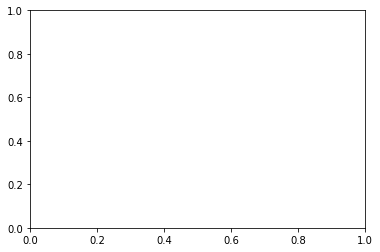

In [10]:
#df_hashtags = pd.DataFrame.from_dict(hashtag_dict)
#df_hashtags[]
hashtag_dict.keys()
plt.plot(range(len(hashtag_dict.keys())), hashtag_dict.values())

In [4]:
with open(f'analysis/retweet.json') as json_file:
    retweet = json.load(json_file)  

In [5]:
len(retweet)

29434

In [14]:
network = {}
links = []
for user in retweet:
    annots = retweet[user]
    network_friends = []
    for annot in annots:
        if annot['receiver'] in user_ids:
            network_friends.append(annot['receiver'])
            links.append(f"{user} {annot['receiver']}")
        network[user] = network_friends  

In [15]:
G = nx.parse_edgelist(links, nodetype=int, create_using=nx.DiGraph)


0
1136


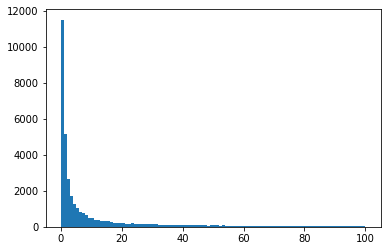

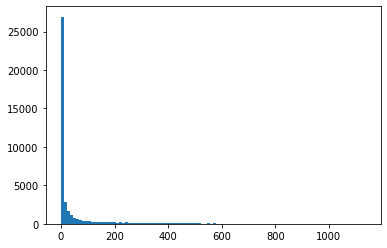

In [17]:
outdegrees = [val for (node, val) in G.out_degree()]
minDeg = min(outdegrees)
print(minDeg)
maxDeg = max(outdegrees)
print(maxDeg)
plt.hist(outdegrees, bins=100, range=[0,100])
#plt.yscale('log', nonposy='clip')
plt.show()

plt.hist(outdegrees, bins=100)
#plt.yscale('log', nonposy='clip')
plt.show()

Only annotated 9038/40959
0
8585


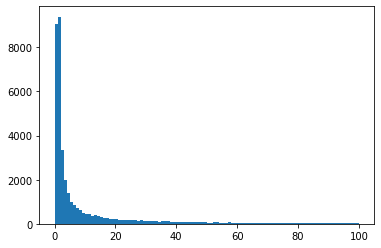

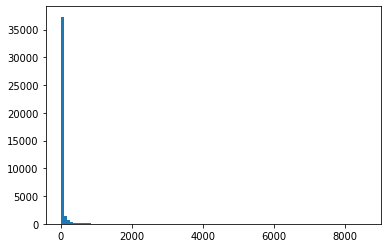

In [21]:
degrees = [val for (node, val) in G.in_degree()]
count_0 = 0 
for d in degrees:
    if d == 0:
        count_0 += 1
print(f'Only annotated {count_0}/{len(degrees)}')

minDeg = min(degrees)
print(minDeg)
maxDeg = max(degrees)
print(maxDeg)
plt.hist(degrees, bins=100, range=[0,100])
plt.show()

#plt.yscale('log', nonposy='clip')
plt.hist(degrees, bins=100)
plt.show()


In [22]:
high_indeg = []
for (node, val) in G.in_degree():
    if val > 1000:
        high_indeg.append((node,val))
len(high_indeg)

394

In [28]:
indeg = [val for (node, val) in  high_indeg]
outdeg = [G.out_degree(node) for (node, val) in  high_indeg]
ids = [node for (node, val) in  high_indeg]
high_indeg_names = [users[str(node)]['screen_name'] for (node, val) in  high_indeg]
most_popular = pd.DataFrame()

most_popular['screen_name'] = high_indeg_names
most_popular['id']=ids
most_popular['indegree']=indeg
most_popular['outdegree']=outdeg

most_popular = most_popular.sort_values(by=['indegree'], ascending=False)
most_popular = most_popular.head(n=1000)
pop_ids = set(most_popular['id'])
pop_screen_names = set(most_popular['screen_name'])
print(most_popular)

         screen_name                   id  indegree  outdegree
45        RT_Deutsch           2561586612      8585         12
120      Hartes_Geld   860808843667935232      8488          0
37         TeamKenFM           2391765882      7853         89
78    Junge_Freiheit             32850100      7147          0
108  Beatrix_vStorch            805308596      7052          0
..               ...                  ...       ...        ...
300    JasminKosubek           2742241352      1005        333
247      BlickBreida  1083028187888709633      1004        441
383   DieTagesstimme   962949018098786304      1003         54
102    heritage_lost           1052797580      1002        271
347       Heimattreu             65844384      1002        433

[394 rows x 4 columns]


In [24]:
pop_dict = {}
for index, row in most_popular.iterrows():
    most_pop = {}
    most_pop['screen_name'] = row['screen_name']
    most_pop['indegree']=row['indegree']
    most_pop['outdegree']=row['outdegree']
    pop_dict[row['id']]=most_pop

In [29]:
pop_ids

{10501932,
 15392486,
 16255941,
 16337664,
 16745492,
 19191734,
 19232587,
 19245170,
 21087719,
 21397649,
 22153676,
 24363209,
 28065788,
 28850837,
 32850100,
 34251365,
 42843646,
 46446876,
 49730701,
 58285254,
 62458253,
 64643056,
 65844384,
 66687715,
 67412123,
 78623043,
 87835261,
 92230638,
 97530140,
 102911449,
 103348278,
 104966264,
 112981901,
 116139004,
 121068845,
 123824735,
 126278129,
 128370270,
 144580542,
 172484281,
 172884537,
 176485591,
 177328552,
 180066019,
 183409796,
 194538182,
 220533211,
 229837716,
 235403138,
 253026595,
 269751237,
 271417475,
 277459070,
 282687385,
 312552966,
 327278213,
 330357834,
 347707246,
 360453378,
 365590517,
 411777000,
 416417316,
 435389605,
 472447110,
 473098032,
 475275997,
 488615658,
 489222890,
 493022442,
 496875603,
 502751959,
 526262684,
 541131956,
 549286546,
 555939556,
 577966360,
 580934565,
 591422285,
 596243227,
 607159536,
 628046813,
 730360237,
 746538475,
 805308596,
 809895794,
 83554166

In [31]:
network_pop = {}
links_pop = []
for user in retweet:
    if int(user) not in pop_ids:
        continue
    annots = retweet[user]
    network_friends = []
    for annot in annots:
        print(annot)
        if annot['receiver'] in pop_ids:
            network_friends.append(annot['receiver'])
            links_pop.append(f"{user} {annot['receiver']}")
        network_pop[user] = network_friends  


{'tweet': 1324834304120283139, 'sender': 1292741467635671040, 'receiver': 255117790}
{'tweet': 1324832177863929856, 'sender': 1292741467635671040, 'receiver': 49730701}
{'tweet': 1324831468569415682, 'sender': 1292741467635671040, 'receiver': 2238482026}
{'tweet': 1324830925897781252, 'sender': 1292741467635671040, 'receiver': 255117790}
{'tweet': 1324627965301448705, 'sender': 1292741467635671040, 'receiver': 1128058333984849921}
{'tweet': 1324627583162605568, 'sender': 1292741467635671040, 'receiver': 1292741467635671040}
{'tweet': 1324627427033817089, 'sender': 1292741467635671040, 'receiver': 1314610334771093505}
{'tweet': 1324450107157262338, 'sender': 1292741467635671040, 'receiver': 1290656362595221505}
{'tweet': 1324450107157262338, 'sender': 1292741467635671040, 'receiver': 1268251136512987138}
{'tweet': 1324434771372625920, 'sender': 1292741467635671040, 'receiver': 1268251136512987138}
{'tweet': 1324407937461293064, 'sender': 1292741467635671040, 'receiver': 1271805702294646

{'tweet': 1322513707713335298, 'sender': 1309441830287794177, 'receiver': 1272117052757757952}
{'tweet': 1322513707713335298, 'sender': 1309441830287794177, 'receiver': 912554362362372099}
{'tweet': 1322513707713335298, 'sender': 1309441830287794177, 'receiver': 1253930584793120768}
{'tweet': 1322513707713335298, 'sender': 1309441830287794177, 'receiver': 255117790}
{'tweet': 1322513608438407175, 'sender': 1309441830287794177, 'receiver': 255117790}
{'tweet': 1322513608438407175, 'sender': 1309441830287794177, 'receiver': 1260225760750702594}
{'tweet': 1322513608438407175, 'sender': 1309441830287794177, 'receiver': 1272117052757757952}
{'tweet': 1322513608438407175, 'sender': 1309441830287794177, 'receiver': 912554362362372099}
{'tweet': 1322513608438407175, 'sender': 1309441830287794177, 'receiver': 1253930584793120768}
{'tweet': 1322513428506939392, 'sender': 1309441830287794177, 'receiver': 1272117052757757952}
{'tweet': 1322513428506939392, 'sender': 1309441830287794177, 'receiver'

{'tweet': 1316468369198067712, 'sender': 1084567774448496641, 'receiver': 1258662200723587072}
{'tweet': 1316464780752887809, 'sender': 1084567774448496641, 'receiver': 454873093}
{'tweet': 1316464280859029505, 'sender': 1084567774448496641, 'receiver': 992191771995144192}
{'tweet': 1316464280859029505, 'sender': 1084567774448496641, 'receiver': 1034847431068987400}
{'tweet': 1316458734806335488, 'sender': 1084567774448496641, 'receiver': 997855393329176579}
{'tweet': 1316443246508363776, 'sender': 1084567774448496641, 'receiver': 869941847468199936}
{'tweet': 1316440665312681987, 'sender': 1084567774448496641, 'receiver': 992191771995144192}
{'tweet': 1316440665312681987, 'sender': 1084567774448496641, 'receiver': 1034847431068987400}
{'tweet': 1316379105827467269, 'sender': 1084567774448496641, 'receiver': 229837716}
{'tweet': 1316378760208408578, 'sender': 1084567774448496641, 'receiver': 229837716}
{'tweet': 1316378760208408578, 'sender': 1084567774448496641, 'receiver': 23581265}


{'tweet': 1297470667860971520, 'sender': 1271736141474140160, 'receiver': 1010248944977416194}
{'tweet': 1297469949468958720, 'sender': 1271736141474140160, 'receiver': 1010248944977416194}
{'tweet': 1297468260062027776, 'sender': 1271736141474140160, 'receiver': 757922999769133056}
{'tweet': 1297450673609551872, 'sender': 1271736141474140160, 'receiver': 912304963715518464}
{'tweet': 1297414574539513856, 'sender': 1271736141474140160, 'receiver': 2932702731}
{'tweet': 1297159332338044928, 'sender': 1271736141474140160, 'receiver': 496875603}
{'tweet': 1297158755482771456, 'sender': 1271736141474140160, 'receiver': 180066019}
{'tweet': 1297158696322191360, 'sender': 1271736141474140160, 'receiver': 180066019}
{'tweet': 1297092156474220545, 'sender': 1271736141474140160, 'receiver': 1036513063082582016}
{'tweet': 1297068207073824769, 'sender': 1271736141474140160, 'receiver': 1168983223159984128}
{'tweet': 1297058694404988928, 'sender': 1271736141474140160, 'receiver': 11822659514981826

{'tweet': 1322559249348726785, 'sender': 1231212207079292928, 'receiver': 949716485068541957}
{'tweet': 1322480157072990209, 'sender': 1231212207079292928, 'receiver': 621913837}
{'tweet': 1322479319944515584, 'sender': 1231212207079292928, 'receiver': 1210882455172870144}
{'tweet': 1322476219305201664, 'sender': 1231212207079292928, 'receiver': 1210882455172870144}
{'tweet': 1322468991076569088, 'sender': 1231212207079292928, 'receiver': 867391954576977920}
{'tweet': 1322449422148608001, 'sender': 1231212207079292928, 'receiver': 50389195}
{'tweet': 1322444700700319744, 'sender': 1231212207079292928, 'receiver': 1105131353228656642}
{'tweet': 1322441815673479168, 'sender': 1231212207079292928, 'receiver': 811099651596230656}
{'tweet': 1322441376185929728, 'sender': 1231212207079292928, 'receiver': 1041222275821920256}
{'tweet': 1322439557489582080, 'sender': 1231212207079292928, 'receiver': 50969880}
{'tweet': 1322438480287457280, 'sender': 1231212207079292928, 'receiver': 12586622007

{'tweet': 1325029528842989568, 'sender': 1247587635096432646, 'receiver': 1194849794671489025}
{'tweet': 1325028796047765504, 'sender': 1247587635096432646, 'receiver': 1194849794671489025}
{'tweet': 1324978327594160128, 'sender': 1247587635096432646, 'receiver': 907354122613149697}
{'tweet': 1324972272130592770, 'sender': 1247587635096432646, 'receiver': 1259495409770168321}
{'tweet': 1324970293006307333, 'sender': 1247587635096432646, 'receiver': 1271805702294646784}
{'tweet': 1324969964059717632, 'sender': 1247587635096432646, 'receiver': 905615935}
{'tweet': 1324967473888817152, 'sender': 1247587635096432646, 'receiver': 1262739447428177920}
{'tweet': 1324967413801242626, 'sender': 1247587635096432646, 'receiver': 1262739447428177920}
{'tweet': 1324963473550438400, 'sender': 1247587635096432646, 'receiver': 1165962948566802432}
{'tweet': 1324824143402094598, 'sender': 1247587635096432646, 'receiver': 21188017}
{'tweet': 1324811132360630278, 'sender': 1247587635096432646, 'receiver'

{'tweet': 1324291821619609601, 'sender': 901517529591558144, 'receiver': 767446001481347072}
{'tweet': 1324291112304070656, 'sender': 901517529591558144, 'receiver': 1244002053338382337}
{'tweet': 1324290520412246016, 'sender': 901517529591558144, 'receiver': 1513474675}
{'tweet': 1324290331580518401, 'sender': 901517529591558144, 'receiver': 1248880929122193410}
{'tweet': 1324282674274467840, 'sender': 901517529591558144, 'receiver': 1513474675}
{'tweet': 1324279180754886656, 'sender': 901517529591558144, 'receiver': 4149878551}
{'tweet': 1324078856165314562, 'sender': 901517529591558144, 'receiver': 1262739447428177920}
{'tweet': 1324075256202645505, 'sender': 901517529591558144, 'receiver': 763516179868704768}
{'tweet': 1324074788051189760, 'sender': 901517529591558144, 'receiver': 360453378}
{'tweet': 1324049467977379841, 'sender': 901517529591558144, 'receiver': 1513474675}
{'tweet': 1324049276637425668, 'sender': 901517529591558144, 'receiver': 1215376155043409920}
{'tweet': 1324

{'tweet': 1251244988412956677, 'sender': 1230103921701597184, 'receiver': 896731507561304064}
{'tweet': 1251244988412956677, 'sender': 1230103921701597184, 'receiver': 1952015173}
{'tweet': 1251244988412956677, 'sender': 1230103921701597184, 'receiver': 2237588498}
{'tweet': 1251167100527353856, 'sender': 1230103921701597184, 'receiver': 1005328983846682624}
{'tweet': 1251136394833117186, 'sender': 1230103921701597184, 'receiver': 901067746208866304}
{'tweet': 1251136394833117186, 'sender': 1230103921701597184, 'receiver': 1102928046049423360}
{'tweet': 1251058147239825409, 'sender': 1230103921701597184, 'receiver': 822578462007447552}
{'tweet': 1251034109838872576, 'sender': 1230103921701597184, 'receiver': 822578462007447552}
{'tweet': 1250892100402642945, 'sender': 1230103921701597184, 'receiver': 1105894085108350977}
{'tweet': 1250740878446125061, 'sender': 1230103921701597184, 'receiver': 1219344216041586688}
{'tweet': 1250740878446125061, 'sender': 1230103921701597184, 'receiver'

{'tweet': 1316731035535773697, 'sender': 957154283002179584, 'receiver': 957154283002179584}
{'tweet': 1316728137678544896, 'sender': 957154283002179584, 'receiver': 1100522194042540032}
{'tweet': 1316728106053496832, 'sender': 957154283002179584, 'receiver': 1100522194042540032}
{'tweet': 1316728106053496832, 'sender': 957154283002179584, 'receiver': 957154283002179584}
{'tweet': 1316727551352602629, 'sender': 957154283002179584, 'receiver': 957154283002179584}
{'tweet': 1316724648273424387, 'sender': 957154283002179584, 'receiver': 957154283002179584}
{'tweet': 1316696186607280128, 'sender': 957154283002179584, 'receiver': 86798117}
{'tweet': 1316695255622791168, 'sender': 957154283002179584, 'receiver': 1105894085108350977}
{'tweet': 1316680553031139328, 'sender': 957154283002179584, 'receiver': 869941847468199936}
{'tweet': 1316661785227915264, 'sender': 957154283002179584, 'receiver': 956119303996235776}
{'tweet': 1316661624787402752, 'sender': 957154283002179584, 'receiver': 9902

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'tweet': 1320773932027445248, 'sender': 1008115832642252800, 'receiver': 1234225210401882112}
{'tweet': 1320773932027445248, 'sender': 1008115832642252800, 'receiver': 1008115832642252800}
{'tweet': 1320773932027445248, 'sender': 1008115832642252800, 'receiver': 1005484560052781056}
{'tweet': 1320732226296913920, 'sender': 1008115832642252800, 'receiver': 763516179868704768}
{'tweet': 1320732184580411392, 'sender': 1008115832642252800, 'receiver': 763516179868704768}
{'tweet': 1320729687111487488, 'sender': 1008115832642252800, 'receiver': 1234225210401882112}
{'tweet': 1320729687111487488, 'sender': 1008115832642252800, 'receiver': 1005484560052781056}
{'tweet': 1320725875139268609, 'sender': 1008115832642252800, 'receiver': 2391765882}
{'tweet': 1320723976293912577, 'sender': 1008115832642252800, 'receiver': 1234225210401882112}
{'tweet': 1320723976293912577, 'sender': 1008115832642252800, 'receiver': 1005484560052781056}
{'tweet': 1320719964194689025, 'sender': 1008115832642252800

{'tweet': 1301586805356077056, 'sender': 3294955113, 'receiver': 1109824115081396224}
{'tweet': 1301586686078377984, 'sender': 3294955113, 'receiver': 1049758147089506304}
{'tweet': 1301076115553951751, 'sender': 3294955113, 'receiver': 1049758147089506304}
{'tweet': 1301076103336005633, 'sender': 3294955113, 'receiver': 1049758147089506304}
{'tweet': 1300921794036150272, 'sender': 3294955113, 'receiver': 1081682269117579274}
{'tweet': 1300794728682852355, 'sender': 3294955113, 'receiver': 1049758147089506304}
{'tweet': 1300753716128120834, 'sender': 3294955113, 'receiver': 822578462007447552}
{'tweet': 1300752637520998400, 'sender': 3294955113, 'receiver': 1215243508782632960}
{'tweet': 1300752637520998400, 'sender': 3294955113, 'receiver': 2710527782}
{'tweet': 1300557726590918665, 'sender': 3294955113, 'receiver': 1049758147089506304}
{'tweet': 1300432948425097221, 'sender': 3294955113, 'receiver': 1194849794671489025}
{'tweet': 1299873182594236418, 'sender': 3294955113, 'receiver':

{'tweet': 1325705474789044229, 'sender': 21397649, 'receiver': 835077430779998209}
{'tweet': 1325705201404289025, 'sender': 21397649, 'receiver': 2413219236}
{'tweet': 1325589602359447552, 'sender': 21397649, 'receiver': 835077430779998209}
{'tweet': 1325587829846585346, 'sender': 21397649, 'receiver': 835077430779998209}
{'tweet': 1325568681640939520, 'sender': 21397649, 'receiver': 1407192332}
{'tweet': 1325568681640939520, 'sender': 21397649, 'receiver': 105397850}
{'tweet': 1325568681640939520, 'sender': 21397649, 'receiver': 229785547}
{'tweet': 1325562290742190082, 'sender': 21397649, 'receiver': 1407192332}
{'tweet': 1325562290742190082, 'sender': 21397649, 'receiver': 105397850}
{'tweet': 1325562290742190082, 'sender': 21397649, 'receiver': 229785547}
{'tweet': 1325560730964332544, 'sender': 21397649, 'receiver': 1407192332}
{'tweet': 1325560730964332544, 'sender': 21397649, 'receiver': 105397850}
{'tweet': 1325560730964332544, 'sender': 21397649, 'receiver': 229785547}
{'tweet

{'tweet': 1321329787437273089, 'sender': 180066019, 'receiver': 789392217764827136}
{'tweet': 1321329586228125696, 'sender': 180066019, 'receiver': 1010248944977416194}
{'tweet': 1321329558734491648, 'sender': 180066019, 'receiver': 1010248944977416194}
{'tweet': 1321327714192760832, 'sender': 180066019, 'receiver': 144580542}
{'tweet': 1321324197856030720, 'sender': 180066019, 'receiver': 21397649}
{'tweet': 1321317794957451265, 'sender': 180066019, 'receiver': 180066019}
{'tweet': 1321314816053678081, 'sender': 180066019, 'receiver': 1237795356794073089}
{'tweet': 1321314365321236480, 'sender': 180066019, 'receiver': 1294274925973438469}
{'tweet': 1321314274472591360, 'sender': 180066019, 'receiver': 1299926834755190784}
{'tweet': 1321313911040299008, 'sender': 180066019, 'receiver': 107466595}
{'tweet': 1321313911040299008, 'sender': 180066019, 'receiver': 203510016}
{'tweet': 1321313911040299008, 'sender': 180066019, 'receiver': 144580542}
{'tweet': 1321313911040299008, 'sender': 1

{'tweet': 1324414787036585984, 'sender': 4260260649, 'receiver': 703680092468342785}
{'tweet': 1324412094494789632, 'sender': 4260260649, 'receiver': 958775881878724608}
{'tweet': 1324412094494789632, 'sender': 4260260649, 'receiver': 4260260649}
{'tweet': 1324391273344733184, 'sender': 4260260649, 'receiver': 2385209545}
{'tweet': 1324369082284711937, 'sender': 4260260649, 'receiver': 360453378}
{'tweet': 1324303270962188288, 'sender': 4260260649, 'receiver': 4260260649}
{'tweet': 1324296700060729348, 'sender': 4260260649, 'receiver': 860808843667935232}
{'tweet': 1324296542531051520, 'sender': 4260260649, 'receiver': 860808843667935232}
{'tweet': 1324294023918587904, 'sender': 4260260649, 'receiver': 849458716592275459}
{'tweet': 1323951005923446784, 'sender': 4260260649, 'receiver': 963654201346789377}
{'tweet': 1323938797365698560, 'sender': 4260260649, 'receiver': 2869454434}
{'tweet': 1323887008264146944, 'sender': 4260260649, 'receiver': 1081152150695223296}
{'tweet': 1323770040

{'tweet': 1314981892312240134, 'sender': 937431140931076097, 'receiver': 1210997465450569728}
{'tweet': 1314981817112563714, 'sender': 937431140931076097, 'receiver': 97371290}
{'tweet': 1314981721310363648, 'sender': 937431140931076097, 'receiver': 1025273220302290944}
{'tweet': 1314981421589594112, 'sender': 937431140931076097, 'receiver': 898586187291656192}
{'tweet': 1314981421589594112, 'sender': 937431140931076097, 'receiver': 907354122613149697}
{'tweet': 1314981343449812992, 'sender': 937431140931076097, 'receiver': 907354122613149697}
{'tweet': 1314981140739088385, 'sender': 937431140931076097, 'receiver': 947238380454150145}
{'tweet': 1314981109562830849, 'sender': 937431140931076097, 'receiver': 1025273220302290944}
{'tweet': 1314980963521359874, 'sender': 937431140931076097, 'receiver': 1025273220302290944}
{'tweet': 1314980647568584705, 'sender': 937431140931076097, 'receiver': 947238380454150145}
{'tweet': 1314980220630372352, 'sender': 937431140931076097, 'receiver': 121

{'tweet': 1319628379944091648, 'sender': 892030434938421250, 'receiver': 892030434938421250}
{'tweet': 1319604400617328641, 'sender': 892030434938421250, 'receiver': 950733999940530176}
{'tweet': 1319604304383254528, 'sender': 892030434938421250, 'receiver': 1105131353228656642}
{'tweet': 1319593098004004872, 'sender': 892030434938421250, 'receiver': 1964353897}
{'tweet': 1319593098004004872, 'sender': 892030434938421250, 'receiver': 907354122613149697}
{'tweet': 1319592985156268032, 'sender': 892030434938421250, 'receiver': 907354122613149697}
{'tweet': 1319592729278619649, 'sender': 892030434938421250, 'receiver': 1231212207079292928}
{'tweet': 1319592721800138752, 'sender': 892030434938421250, 'receiver': 979824252881948672}
{'tweet': 1319592721800138752, 'sender': 892030434938421250, 'receiver': 1105131353228656642}
{'tweet': 1319592720260911104, 'sender': 892030434938421250, 'receiver': 1105131353228656642}
{'tweet': 1319586815423221762, 'sender': 892030434938421250, 'receiver': 4

{'tweet': 1282218395627290625, 'sender': 849060114388705280, 'receiver': 849060114388705280}
{'tweet': 1282216923778908162, 'sender': 849060114388705280, 'receiver': 1206967630474731520}
{'tweet': 1282216923778908162, 'sender': 849060114388705280, 'receiver': 849060114388705280}
{'tweet': 1282216773681590273, 'sender': 849060114388705280, 'receiver': 849060114388705280}
{'tweet': 1282211140328710144, 'sender': 849060114388705280, 'receiver': 148689810}
{'tweet': 1282017433516158976, 'sender': 849060114388705280, 'receiver': 849060114388705280}
{'tweet': 1281968233797636102, 'sender': 849060114388705280, 'receiver': 851496036472324098}
{'tweet': 1281967974308405249, 'sender': 849060114388705280, 'receiver': 1071737698732380160}
{'tweet': 1281895318653743108, 'sender': 849060114388705280, 'receiver': 849060114388705280}
{'tweet': 1281580227987230721, 'sender': 849060114388705280, 'receiver': 3297493011}
{'tweet': 1281510517790695431, 'sender': 849060114388705280, 'receiver': 849060114388

{'tweet': 1323418833093382146, 'sender': 822578462007447552, 'receiver': 924541454529236993}
{'tweet': 1323416405862207489, 'sender': 822578462007447552, 'receiver': 1279750920285425664}
{'tweet': 1323416405862207489, 'sender': 822578462007447552, 'receiver': 97530140}
{'tweet': 1323415643761332224, 'sender': 822578462007447552, 'receiver': 794249472972849152}
{'tweet': 1323415643761332224, 'sender': 822578462007447552, 'receiver': 726815926205698050}
{'tweet': 1323414906855706626, 'sender': 822578462007447552, 'receiver': 1274715094623100930}
{'tweet': 1323414600663113729, 'sender': 822578462007447552, 'receiver': 97530140}
{'tweet': 1323414458023239686, 'sender': 822578462007447552, 'receiver': 1363346095}
{'tweet': 1323409909715738627, 'sender': 822578462007447552, 'receiver': 1057608657695895552}
{'tweet': 1323409909715738627, 'sender': 822578462007447552, 'receiver': 822578462007447552}
{'tweet': 1323409909715738627, 'sender': 822578462007447552, 'receiver': 786113892892180481}
{'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'tweet': 1314538403782950912, 'sender': 229837716, 'receiver': 1294274925973438469}
{'tweet': 1314462177294680066, 'sender': 229837716, 'receiver': 1265367912724025345}
{'tweet': 1314458080294432769, 'sender': 229837716, 'receiver': 1008115832642252800}
{'tweet': 1314448566824427523, 'sender': 229837716, 'receiver': 1008115832642252800}
{'tweet': 1314277485102739456, 'sender': 229837716, 'receiver': 229837716}
{'tweet': 1314250806095470593, 'sender': 229837716, 'receiver': 828643413960642561}
{'tweet': 1314243885388959744, 'sender': 229837716, 'receiver': 1212381463292739589}
{'tweet': 1314241982353604608, 'sender': 229837716, 'receiver': 229837716}
{'tweet': 1314215630338437120, 'sender': 229837716, 'receiver': 1148926700719394816}
{'tweet': 1314213730259890177, 'sender': 229837716, 'receiver': 2237588498}
{'tweet': 1314206383529627649, 'sender': 229837716, 'receiver': 919606742115381248}
{'tweet': 1314089006238441472, 'sender': 229837716, 'receiver': 1223704392840417280}
{'tweet': 

{'tweet': 1278367443912704001, 'sender': 16337664, 'receiver': 2385209545}
{'tweet': 1278367443912704001, 'sender': 16337664, 'receiver': 860808843667935232}
{'tweet': 1278367443912704001, 'sender': 16337664, 'receiver': 22153676}
{'tweet': 1278367443912704001, 'sender': 16337664, 'receiver': 28065788}
{'tweet': 1278367443912704001, 'sender': 16337664, 'receiver': 3448073356}
{'tweet': 1278367443912704001, 'sender': 16337664, 'receiver': 283601585}
{'tweet': 1278311068947877889, 'sender': 16337664, 'receiver': 16337664}
{'tweet': 1278287241236922368, 'sender': 16337664, 'receiver': 16337664}
{'tweet': 1278059131539206145, 'sender': 16337664, 'receiver': 1226805308196036608}
{'tweet': 1277855152528142336, 'sender': 16337664, 'receiver': 16337664}
{'tweet': 1277855116247343105, 'sender': 16337664, 'receiver': 16337664}
{'tweet': 1277730924181020674, 'sender': 16337664, 'receiver': 526262684}
{'tweet': 1277728851976753154, 'sender': 16337664, 'receiver': 16337664}
{'tweet': 12777229299215

{'tweet': 1308056955316064257, 'sender': 1633570850, 'receiver': 62458253}
{'tweet': 1308036608483094529, 'sender': 1633570850, 'receiver': 800990319189852160}
{'tweet': 1308035157316730886, 'sender': 1633570850, 'receiver': 1126121579686125568}
{'tweet': 1308035157316730886, 'sender': 1633570850, 'receiver': 1633570850}
{'tweet': 1308030597462470659, 'sender': 1633570850, 'receiver': 1513474675}
{'tweet': 1308030113880080390, 'sender': 1633570850, 'receiver': 110774602}
{'tweet': 1308023145526431746, 'sender': 1633570850, 'receiver': 1237736394585448449}
{'tweet': 1308022898234404864, 'sender': 1633570850, 'receiver': 1116719567034814464}
{'tweet': 1308018030534893570, 'sender': 1633570850, 'receiver': 2391765882}
{'tweet': 1308017651445366784, 'sender': 1633570850, 'receiver': 1036270573138141187}
{'tweet': 1308014849310552069, 'sender': 1633570850, 'receiver': 152734006}
{'tweet': 1308013956309581825, 'sender': 1633570850, 'receiver': 488615658}
{'tweet': 1308013956309581825, 'sende

{'tweet': 1319825811902431232, 'sender': 183409796, 'receiver': 112981901}
{'tweet': 1319825732198146048, 'sender': 183409796, 'receiver': 1112306856704249857}
{'tweet': 1319825732198146048, 'sender': 183409796, 'receiver': 1225490773879250945}
{'tweet': 1319825732198146048, 'sender': 183409796, 'receiver': 953341454788775936}
{'tweet': 1319825530200510465, 'sender': 183409796, 'receiver': 1112306856704249857}
{'tweet': 1319825530200510465, 'sender': 183409796, 'receiver': 1225490773879250945}
{'tweet': 1319825530200510465, 'sender': 183409796, 'receiver': 183409796}
{'tweet': 1319825530200510465, 'sender': 183409796, 'receiver': 953341454788775936}
{'tweet': 1319825434176069632, 'sender': 183409796, 'receiver': 4228125793}
{'tweet': 1319825434176069632, 'sender': 183409796, 'receiver': 112981901}
{'tweet': 1319824652563263488, 'sender': 183409796, 'receiver': 1227614251390504960}
{'tweet': 1319823744651743239, 'sender': 183409796, 'receiver': 3427951089}
{'tweet': 1319822242344325120,

{'tweet': 1314872517035732994, 'sender': 1225319992469663745, 'receiver': 2237588498}
{'tweet': 1314870779624992772, 'sender': 1225319992469663745, 'receiver': 2391765882}
{'tweet': 1314809832235507714, 'sender': 1225319992469663745, 'receiver': 1224033134326558721}
{'tweet': 1314686795070820353, 'sender': 1225319992469663745, 'receiver': 852028737289732099}
{'tweet': 1314686795070820353, 'sender': 1225319992469663745, 'receiver': 1250160993352777731}
{'tweet': 1314686795070820353, 'sender': 1225319992469663745, 'receiver': 763516179868704768}
{'tweet': 1314686795070820353, 'sender': 1225319992469663745, 'receiver': 953273726379970561}
{'tweet': 1314639457870635017, 'sender': 1225319992469663745, 'receiver': 2522828272}
{'tweet': 1314638544317620225, 'sender': 1225319992469663745, 'receiver': 360453378}
{'tweet': 1314635001187774470, 'sender': 1225319992469663745, 'receiver': 1280916447510790149}
{'tweet': 1314635001187774470, 'sender': 1225319992469663745, 'receiver': 1100834877484793

{'tweet': 1325511925409705988, 'sender': 1055605594932068354, 'receiver': 912304963715518464}
{'tweet': 1325508819967938560, 'sender': 1055605594932068354, 'receiver': 1283433602525605898}
{'tweet': 1325277056104620034, 'sender': 1055605594932068354, 'receiver': 1122160150570311680}
{'tweet': 1325276507317661696, 'sender': 1055605594932068354, 'receiver': 1864102783}
{'tweet': 1325276507317661696, 'sender': 1055605594932068354, 'receiver': 869941847468199936}
{'tweet': 1325276409024143361, 'sender': 1055605594932068354, 'receiver': 1215376155043409920}
{'tweet': 1325276190991638528, 'sender': 1055605594932068354, 'receiver': 851496036472324098}
{'tweet': 1325275918756089856, 'sender': 1055605594932068354, 'receiver': 235268257}
{'tweet': 1325275918756089856, 'sender': 1055605594932068354, 'receiver': 1164456596031856640}
{'tweet': 1325275863668183040, 'sender': 1055605594932068354, 'receiver': 1226674533190557697}
{'tweet': 1325275863668183040, 'sender': 1055605594932068354, 'receiver'

{'tweet': 1300173451270017024, 'sender': 756566378593779713, 'receiver': 1111621720279056384}
{'tweet': 1300172627768758272, 'sender': 756566378593779713, 'receiver': 820565707448582144}
{'tweet': 1300167741115166722, 'sender': 756566378593779713, 'receiver': 978966055212273665}
{'tweet': 1300153262381953024, 'sender': 756566378593779713, 'receiver': 274448991}
{'tweet': 1300144352807792640, 'sender': 756566378593779713, 'receiver': 360453378}
{'tweet': 1300143166692233218, 'sender': 756566378593779713, 'receiver': 1111610926875246592}
{'tweet': 1300140781584424960, 'sender': 756566378593779713, 'receiver': 1143194983610142720}
{'tweet': 1300136365619908612, 'sender': 756566378593779713, 'receiver': 1156990689084882944}
{'tweet': 1300136077429288961, 'sender': 756566378593779713, 'receiver': 1192833474073432064}
{'tweet': 1300132751392284676, 'sender': 756566378593779713, 'receiver': 1224394967289880577}
{'tweet': 1300120322700697604, 'sender': 756566378593779713, 'receiver': 191796553

{'tweet': 1322960594677440516, 'sender': 416417316, 'receiver': 828225361964044288}
{'tweet': 1322960594677440516, 'sender': 416417316, 'receiver': 984067777651716096}
{'tweet': 1322960594677440516, 'sender': 416417316, 'receiver': 1270110229028634628}
{'tweet': 1322960594677440516, 'sender': 416417316, 'receiver': 1245613809554743300}
{'tweet': 1322959767577518080, 'sender': 416417316, 'receiver': 3127751023}
{'tweet': 1322956609040076800, 'sender': 416417316, 'receiver': 1385192168}
{'tweet': 1322956351954472961, 'sender': 416417316, 'receiver': 3127751023}
{'tweet': 1322956135486337024, 'sender': 416417316, 'receiver': 2391765882}
{'tweet': 1322951196957704193, 'sender': 416417316, 'receiver': 910924062020554752}
{'tweet': 1322943624938704896, 'sender': 416417316, 'receiver': 2391765882}
{'tweet': 1322915994885591045, 'sender': 416417316, 'receiver': 2391765882}
{'tweet': 1322910037908574214, 'sender': 416417316, 'receiver': 3127751023}
{'tweet': 1322903567074758659, 'sender': 41641

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'tweet': 1234608491098144773, 'sender': 851496036472324098, 'receiver': 1032744612249698311}
{'tweet': 1234528710851780609, 'sender': 851496036472324098, 'receiver': 1216395354389741569}
{'tweet': 1234164465224077317, 'sender': 851496036472324098, 'receiver': 1216395354389741569}
{'tweet': 1234164465224077317, 'sender': 851496036472324098, 'receiver': 841768687245918208}
{'tweet': 1234164140681441280, 'sender': 851496036472324098, 'receiver': 1216395354389741569}
{'tweet': 1234164140681441280, 'sender': 851496036472324098, 'receiver': 841768687245918208}
{'tweet': 1234112122348621826, 'sender': 851496036472324098, 'receiver': 1216395354389741569}
{'tweet': 1234112122348621826, 'sender': 851496036472324098, 'receiver': 841768687245918208}
{'tweet': 1233904048694267907, 'sender': 851496036472324098, 'receiver': 1216395354389741569}
{'tweet': 1233517936649916435, 'sender': 851496036472324098, 'receiver': 1001491205899857920}
{'tweet': 1233280429278584837, 'sender': 851496036472324098, 'r

{'tweet': 1318649724442992641, 'sender': 1010248944977416194, 'receiver': 1265367912724025345}
{'tweet': 1318519316644548608, 'sender': 1010248944977416194, 'receiver': 3291135545}
{'tweet': 1318492996539764736, 'sender': 1010248944977416194, 'receiver': 1285920175464882176}
{'tweet': 1318426666503409665, 'sender': 1010248944977416194, 'receiver': 108906052}
{'tweet': 1318295816621203458, 'sender': 1010248944977416194, 'receiver': 122669982}
{'tweet': 1318291904560246790, 'sender': 1010248944977416194, 'receiver': 122669982}
{'tweet': 1318276571153813507, 'sender': 1010248944977416194, 'receiver': 1025460881495343104}
{'tweet': 1318267285430206465, 'sender': 1010248944977416194, 'receiver': 1273547569357107201}
{'tweet': 1318170831386705922, 'sender': 1010248944977416194, 'receiver': 963654201346789377}
{'tweet': 1318170831386705922, 'sender': 1010248944977416194, 'receiver': 962318245461151744}
{'tweet': 1317951660627513344, 'sender': 1010248944977416194, 'receiver': 49730701}
{'tweet

{'tweet': 1320463153348661249, 'sender': 1138160900463050757, 'receiver': 1257790013607198727}
{'tweet': 1320449011636207616, 'sender': 1138160900463050757, 'receiver': 1154078786226479104}
{'tweet': 1320449011636207616, 'sender': 1138160900463050757, 'receiver': 1269955323697209346}
{'tweet': 1320446932096032777, 'sender': 1138160900463050757, 'receiver': 62458253}
{'tweet': 1320445949504823298, 'sender': 1138160900463050757, 'receiver': 1154078786226479104}
{'tweet': 1320445949504823298, 'sender': 1138160900463050757, 'receiver': 1269955323697209346}
{'tweet': 1320440333688340480, 'sender': 1138160900463050757, 'receiver': 1154078786226479104}
{'tweet': 1320440333688340480, 'sender': 1138160900463050757, 'receiver': 1269955323697209346}
{'tweet': 1320439123728060417, 'sender': 1138160900463050757, 'receiver': 1265367912724025345}
{'tweet': 1320436778998943744, 'sender': 1138160900463050757, 'receiver': 1212381463292739589}
{'tweet': 1320435076149235713, 'sender': 1138160900463050757,

{'tweet': 1316471355706089473, 'sender': 1081224169382166528, 'receiver': 1241474573226455045}
{'tweet': 1316451573057417218, 'sender': 1081224169382166528, 'receiver': 924541454529236993}
{'tweet': 1316447522643152903, 'sender': 1081224169382166528, 'receiver': 924541454529236993}
{'tweet': 1316443696431276032, 'sender': 1081224169382166528, 'receiver': 1213412346544017408}
{'tweet': 1316443696431276032, 'sender': 1081224169382166528, 'receiver': 1081224169382166528}
{'tweet': 1316443534300459018, 'sender': 1081224169382166528, 'receiver': 1213412346544017408}
{'tweet': 1316433188890251265, 'sender': 1081224169382166528, 'receiver': 172484281}
{'tweet': 1316420268613664769, 'sender': 1081224169382166528, 'receiver': 1276517797909184512}
{'tweet': 1316387428362579968, 'sender': 1081224169382166528, 'receiver': 746952624}
{'tweet': 1316372314225868801, 'sender': 1081224169382166528, 'receiver': 130221312}
{'tweet': 1316342586978770944, 'sender': 1081224169382166528, 'receiver': 12153761

{'tweet': 1315279905618382848, 'sender': 1083028187888709633, 'receiver': 1135151150}
{'tweet': 1315279781798313985, 'sender': 1083028187888709633, 'receiver': 1151407506318594048}
{'tweet': 1315279579955765255, 'sender': 1083028187888709633, 'receiver': 1105894085108350977}
{'tweet': 1315233406129565696, 'sender': 1083028187888709633, 'receiver': 1093981660620689408}
{'tweet': 1315231154027597824, 'sender': 1083028187888709633, 'receiver': 1105894085108350977}
{'tweet': 1315163064828743687, 'sender': 1083028187888709633, 'receiver': 729706747305308161}
{'tweet': 1315049824740413440, 'sender': 1083028187888709633, 'receiver': 950882597881737216}
{'tweet': 1315026406833827841, 'sender': 1083028187888709633, 'receiver': 1034041131158396929}
{'tweet': 1315026118416764928, 'sender': 1083028187888709633, 'receiver': 1034041131158396929}
{'tweet': 1315025907413901313, 'sender': 1083028187888709633, 'receiver': 1034041131158396929}
{'tweet': 1315005317349081088, 'sender': 1083028187888709633,

{'tweet': 1275748298331226113, 'sender': 984067777651716096, 'receiver': 1245381504273911814}
{'tweet': 1275747975919284229, 'sender': 984067777651716096, 'receiver': 1253005220138844161}
{'tweet': 1275747975919284229, 'sender': 984067777651716096, 'receiver': 1255809120403427328}
{'tweet': 1275747975919284229, 'sender': 984067777651716096, 'receiver': 841783724584910848}
{'tweet': 1275747975919284229, 'sender': 984067777651716096, 'receiver': 1245381504273911814}
{'tweet': 1275736772287356929, 'sender': 984067777651716096, 'receiver': 1216470829908873219}
{'tweet': 1275720086259666946, 'sender': 984067777651716096, 'receiver': 1010248944977416194}
{'tweet': 1275720086259666946, 'sender': 984067777651716096, 'receiver': 984067777651716096}
{'tweet': 1275717991020351488, 'sender': 984067777651716096, 'receiver': 1010248944977416194}
{'tweet': 1275716927399305221, 'sender': 984067777651716096, 'receiver': 1010248944977416194}
{'tweet': 1275715579618394112, 'sender': 984067777651716096, '

{'tweet': 1324413555530174467, 'sender': 2237588498, 'receiver': 496875603}
{'tweet': 1324413467282100226, 'sender': 2237588498, 'receiver': 496875603}
{'tweet': 1324413416560316417, 'sender': 2237588498, 'receiver': 496875603}
{'tweet': 1324413379163860994, 'sender': 2237588498, 'receiver': 496875603}
{'tweet': 1324413248100249600, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1324413248100249600, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1324413138746429440, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1324413138746429440, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1324413092906831873, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1324413052985507851, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1324412281543970816, 'sender': 2237588498, 'receiver': 1071737698732380160}
{'tweet': 1324412281543970816, 'sender': 2237588498, 'receiver': 2237588498}
{'tweet': 1324412040031

{'tweet': 1318913484244066305, 'sender': 2237588498, 'receiver': 1597883136}
{'tweet': 1318913310742482946, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913310742482946, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913275980021762, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913229435899905, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913192265998336, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913134925668354, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913098816933888, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913098816933888, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913067032498185, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318913036581822464, 'sender': 2237588498, 'receiver': 720532174362058752}
{'tweet': 1318912948300058624, 'sender': 2237588498, 'receiver': 49687560

{'tweet': 1304867754986606595, 'sender': 62458253, 'receiver': 62458253}
{'tweet': 1304867595691139072, 'sender': 62458253, 'receiver': 1265268666763018240}
{'tweet': 1304867595691139072, 'sender': 62458253, 'receiver': 1125718512310345728}
{'tweet': 1304853578239143938, 'sender': 62458253, 'receiver': 2821129845}
{'tweet': 1304853578239143938, 'sender': 62458253, 'receiver': 1860204577}
{'tweet': 1304852593026494467, 'sender': 62458253, 'receiver': 1228979274604056576}
{'tweet': 1304852404081491973, 'sender': 62458253, 'receiver': 1239999147350077445}
{'tweet': 1304843641765191690, 'sender': 62458253, 'receiver': 4817168309}
{'tweet': 1304843641765191690, 'sender': 62458253, 'receiver': 1228979274604056576}
{'tweet': 1304840201114734594, 'sender': 62458253, 'receiver': 1228979274604056576}
{'tweet': 1304830180779855872, 'sender': 62458253, 'receiver': 1253005220138844161}
{'tweet': 1304830180779855872, 'sender': 62458253, 'receiver': 67412123}
{'tweet': 1304828596238852096, 'sender': 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'tweet': 1217794239284813824, 'sender': 1917965538, 'receiver': 834882696161738753}
{'tweet': 1217794239284813824, 'sender': 1917965538, 'receiver': 1589404632}
{'tweet': 1217794239284813824, 'sender': 1917965538, 'receiver': 1917965538}
{'tweet': 1217768571780194304, 'sender': 1917965538, 'receiver': 1589404632}
{'tweet': 1217557466201890816, 'sender': 1917965538, 'receiver': 1917965538}
{'tweet': 1217409884565770242, 'sender': 1917965538, 'receiver': 828643413960642561}
{'tweet': 1217409884565770242, 'sender': 1917965538, 'receiver': 1917965538}
{'tweet': 1217409816248881152, 'sender': 1917965538, 'receiver': 1917965538}
{'tweet': 1217409816248881152, 'sender': 1917965538, 'receiver': 828643413960642561}
{'tweet': 1217409679778893824, 'sender': 1917965538, 'receiver': 1917965538}
{'tweet': 1217409559142326273, 'sender': 1917965538, 'receiver': 1179795242662453248}
{'tweet': 1217409559142326273, 'sender': 1917965538, 'receiver': 1917965538}
{'tweet': 1217409559142326273, 'sender': 19

{'tweet': 1320463843039072257, 'sender': 694628041654456320, 'receiver': 904395042810363908}
{'tweet': 1319915361400201216, 'sender': 694628041654456320, 'receiver': 1182265951498182656}
{'tweet': 1319878773861502976, 'sender': 694628041654456320, 'receiver': 907354122613149697}
{'tweet': 1319752583255306240, 'sender': 694628041654456320, 'receiver': 1186643862913277955}
{'tweet': 1319706509362737154, 'sender': 694628041654456320, 'receiver': 788420865012695040}
{'tweet': 1319671366107435008, 'sender': 694628041654456320, 'receiver': 869941847468199936}
{'tweet': 1319660152476307456, 'sender': 694628041654456320, 'receiver': 838448758820122624}
{'tweet': 1319631319652073474, 'sender': 694628041654456320, 'receiver': 1105894085108350977}
{'tweet': 1319602893071261696, 'sender': 694628041654456320, 'receiver': 1305815289662263301}
{'tweet': 1319567069243990016, 'sender': 694628041654456320, 'receiver': 2522828272}
{'tweet': 1319564503701487618, 'sender': 694628041654456320, 'receiver': 1

{'tweet': 1323397238601719808, 'sender': 1025460881495343104, 'receiver': 1300702493752557569}
{'tweet': 1323396842688860167, 'sender': 1025460881495343104, 'receiver': 3936454643}
{'tweet': 1323392619892875265, 'sender': 1025460881495343104, 'receiver': 58285254}
{'tweet': 1323392488275611654, 'sender': 1025460881495343104, 'receiver': 32849722}
{'tweet': 1323392441068720129, 'sender': 1025460881495343104, 'receiver': 1292741467635671040}
{'tweet': 1323391173432692738, 'sender': 1025460881495343104, 'receiver': 97530140}
{'tweet': 1323390069886095360, 'sender': 1025460881495343104, 'receiver': 1025460881495343104}
{'tweet': 1323389913203658760, 'sender': 1025460881495343104, 'receiver': 1025460881495343104}
{'tweet': 1323388964309508096, 'sender': 1025460881495343104, 'receiver': 860808843667935232}
{'tweet': 1323388887130165254, 'sender': 1025460881495343104, 'receiver': 1258662200723587072}
{'tweet': 1323388887130165254, 'sender': 1025460881495343104, 'receiver': 1283433602525605898

{'tweet': 1304543215807279104, 'sender': 1949424703, 'receiver': 746538475}
{'tweet': 1304363382070489088, 'sender': 1949424703, 'receiver': 1210142406185750529}
{'tweet': 1304363382070489088, 'sender': 1949424703, 'receiver': 1169655295532044288}
{'tweet': 1304363382070489088, 'sender': 1949424703, 'receiver': 102411576}
{'tweet': 1304361750775697408, 'sender': 1949424703, 'receiver': 1235119614004211712}
{'tweet': 1304361750775697408, 'sender': 1949424703, 'receiver': 1949424703}
{'tweet': 1304361750775697408, 'sender': 1949424703, 'receiver': 341367267}
{'tweet': 1304300127083995137, 'sender': 1949424703, 'receiver': 408084708}
{'tweet': 1304299718953107456, 'sender': 1949424703, 'receiver': 1949424703}
{'tweet': 1303980298737258498, 'sender': 1949424703, 'receiver': 1138160900463050757}
{'tweet': 1303316395602644999, 'sender': 1949424703, 'receiver': 949716485068541957}
{'tweet': 1303219441333948416, 'sender': 1949424703, 'receiver': 1034041131158396929}
{'tweet': 13026457990048440

{'tweet': 1320440269989445634, 'sender': 235403138, 'receiver': 917112415980085248}
{'tweet': 1320433767291457537, 'sender': 235403138, 'receiver': 756566378593779713}
{'tweet': 1320433647879704579, 'sender': 235403138, 'receiver': 1105894085108350977}
{'tweet': 1320433647879704579, 'sender': 235403138, 'receiver': 235403138}
{'tweet': 1320431151023034369, 'sender': 235403138, 'receiver': 1105894085108350977}
{'tweet': 1320430125343756292, 'sender': 235403138, 'receiver': 731012097551699969}
{'tweet': 1320428847712579584, 'sender': 235403138, 'receiver': 851496036472324098}
{'tweet': 1320428473312333824, 'sender': 235403138, 'receiver': 1008115832642252800}
{'tweet': 1320428473312333824, 'sender': 235403138, 'receiver': 235403138}
{'tweet': 1320428473312333824, 'sender': 235403138, 'receiver': 1105894085108350977}
{'tweet': 1320428376298016769, 'sender': 235403138, 'receiver': 1008115832642252800}
{'tweet': 1320424661981794304, 'sender': 235403138, 'receiver': 1293218700498219011}
{'tw

{'tweet': 1324005980414377985, 'sender': 926411799381102592, 'receiver': 1034847431068987400}
{'tweet': 1324005638901501962, 'sender': 926411799381102592, 'receiver': 898586187291656192}
{'tweet': 1324002670802358275, 'sender': 926411799381102592, 'receiver': 3609980477}
{'tweet': 1324002320368259073, 'sender': 926411799381102592, 'receiver': 2886118713}
{'tweet': 1324002101870153728, 'sender': 926411799381102592, 'receiver': 3609980477}
{'tweet': 1323998296030040065, 'sender': 926411799381102592, 'receiver': 926411799381102592}
{'tweet': 1323986710448005126, 'sender': 926411799381102592, 'receiver': 1181907411550048256}
{'tweet': 1323981525445185536, 'sender': 926411799381102592, 'receiver': 3427951089}
{'tweet': 1323974996713181184, 'sender': 926411799381102592, 'receiver': 3427951089}
{'tweet': 1323907452379766786, 'sender': 926411799381102592, 'receiver': 1288278540576792577}
{'tweet': 1323894779013378048, 'sender': 926411799381102592, 'receiver': 1889707549}
{'tweet': 132389106133

{'tweet': 1272759678385164293, 'sender': 1729890253, 'receiver': 1014142345}
{'tweet': 1272759435568525312, 'sender': 1729890253, 'receiver': 435389605}
{'tweet': 1272759155670089728, 'sender': 1729890253, 'receiver': 435389605}
{'tweet': 1272630129408249859, 'sender': 1729890253, 'receiver': 995284325414375424}
{'tweet': 1272480610351755264, 'sender': 1729890253, 'receiver': 1233462596826783744}
{'tweet': 1272407809984999424, 'sender': 1729890253, 'receiver': 711496274692935680}
{'tweet': 1272234829350940674, 'sender': 1729890253, 'receiver': 996497269213089793}
{'tweet': 1272219853080932352, 'sender': 1729890253, 'receiver': 2522828272}
{'tweet': 1272206720287326214, 'sender': 1729890253, 'receiver': 912304963715518464}
{'tweet': 1272206251737452544, 'sender': 1729890253, 'receiver': 1106126481439244289}
{'tweet': 1272166434832027652, 'sender': 1729890253, 'receiver': 811274949868535808}
{'tweet': 1272166434832027652, 'sender': 1729890253, 'receiver': 856471467172794369}
{'tweet': 12

{'tweet': 1267009236501958656, 'sender': 347707246, 'receiver': 1228049492496330753}
{'tweet': 1267007806806294529, 'sender': 347707246, 'receiver': 347707246}
{'tweet': 1267007806806294529, 'sender': 347707246, 'receiver': 1177663805591035904}
{'tweet': 1267005172078776320, 'sender': 347707246, 'receiver': 347707246}
{'tweet': 1267003366254743552, 'sender': 347707246, 'receiver': 347707246}
{'tweet': 1267000105166614528, 'sender': 347707246, 'receiver': 347707246}
{'tweet': 1266996294897328128, 'sender': 347707246, 'receiver': 953874531395006464}
{'tweet': 1266995299530297344, 'sender': 347707246, 'receiver': 347707246}
{'tweet': 1266993751890763777, 'sender': 347707246, 'receiver': 347707246}
{'tweet': 1266993751890763777, 'sender': 347707246, 'receiver': 953874531395006464}
{'tweet': 1266993580926816257, 'sender': 347707246, 'receiver': 768064268625383424}
{'tweet': 1266991318460399617, 'sender': 347707246, 'receiver': 1055072266030104577}
{'tweet': 1266991318460399617, 'sender': 34

{'tweet': 1319570593210130433, 'sender': 791302834289537024, 'receiver': 107466595}
{'tweet': 1319563393842487296, 'sender': 791302834289537024, 'receiver': 835244701536124933}
{'tweet': 1319563000840409088, 'sender': 791302834289537024, 'receiver': 1105131353228656642}
{'tweet': 1319562373489938432, 'sender': 791302834289537024, 'receiver': 806869541594730497}
{'tweet': 1319562142656454657, 'sender': 791302834289537024, 'receiver': 2998544291}
{'tweet': 1319451463538659331, 'sender': 791302834289537024, 'receiver': 1833662454}
{'tweet': 1319416639239213057, 'sender': 791302834289537024, 'receiver': 1131565156704686080}
{'tweet': 1319412668298596352, 'sender': 791302834289537024, 'receiver': 1033703179844820992}
{'tweet': 1319406328469651456, 'sender': 791302834289537024, 'receiver': 368369918}
{'tweet': 1319255739580469248, 'sender': 791302834289537024, 'receiver': 1006091392857329664}
{'tweet': 1319254676571906048, 'sender': 791302834289537024, 'receiver': 4162970259}
{'tweet': 13192

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'tweet': 1324705760656252934, 'sender': 1049758147089506304, 'receiver': 1122160150570311680}
{'tweet': 1324686572768251904, 'sender': 1049758147089506304, 'receiver': 1309441830287794177}
{'tweet': 1324686057720279046, 'sender': 1049758147089506304, 'receiver': 1309441830287794177}
{'tweet': 1324685793453989891, 'sender': 1049758147089506304, 'receiver': 1309441830287794177}
{'tweet': 1324684798174978048, 'sender': 1049758147089506304, 'receiver': 1309441830287794177}
{'tweet': 1324683022445105154, 'sender': 1049758147089506304, 'receiver': 1189660560343863300}
{'tweet': 1324682682291249158, 'sender': 1049758147089506304, 'receiver': 1189660560343863300}
{'tweet': 1324666652248612865, 'sender': 1049758147089506304, 'receiver': 4748375223}
{'tweet': 1324658363339173888, 'sender': 1049758147089506304, 'receiver': 1260224146727985152}
{'tweet': 1324658139635937287, 'sender': 1049758147089506304, 'receiver': 1122160150570311680}
{'tweet': 1324649799199547392, 'sender': 104975814708950630

{'tweet': 1322667518914416642, 'sender': 4723069840, 'receiver': 4723069840}
{'tweet': 1322667518914416642, 'sender': 4723069840, 'receiver': 1256983928797306890}
{'tweet': 1322667518914416642, 'sender': 4723069840, 'receiver': 802484561598881792}
{'tweet': 1322667142320447494, 'sender': 4723069840, 'receiver': 1256983928797306890}
{'tweet': 1322667142320447494, 'sender': 4723069840, 'receiver': 802484561598881792}
{'tweet': 1322666229174308864, 'sender': 4723069840, 'receiver': 1256983928797306890}
{'tweet': 1322665756392390656, 'sender': 4723069840, 'receiver': 1952015173}
{'tweet': 1322665508618051586, 'sender': 4723069840, 'receiver': 4723069840}
{'tweet': 1322665258255814657, 'sender': 4723069840, 'receiver': 4723069840}
{'tweet': 1322665258255814657, 'sender': 4723069840, 'receiver': 1271805702294646784}
{'tweet': 1322665258255814657, 'sender': 4723069840, 'receiver': 19232587}
{'tweet': 1322665207357911040, 'sender': 4723069840, 'receiver': 4723069840}
{'tweet': 1322664537582161

{'tweet': 1320412048602312704, 'sender': 708041826058559489, 'receiver': 708022979905658881}
{'tweet': 1320333938028589056, 'sender': 708041826058559489, 'receiver': 708022979905658881}
{'tweet': 1320311201558048768, 'sender': 708041826058559489, 'receiver': 708022979905658881}
{'tweet': 1320304515560710145, 'sender': 708041826058559489, 'receiver': 708022979905658881}
{'tweet': 1320304465401044993, 'sender': 708041826058559489, 'receiver': 1262739447428177920}
{'tweet': 1320299239017250816, 'sender': 708041826058559489, 'receiver': 1216470829908873219}
{'tweet': 1320074608763166721, 'sender': 708041826058559489, 'receiver': 708022979905658881}
{'tweet': 1320065833306148866, 'sender': 708041826058559489, 'receiver': 708041826058559489}
{'tweet': 1320065822912598020, 'sender': 708041826058559489, 'receiver': 708041826058559489}
{'tweet': 1320065793422405633, 'sender': 708041826058559489, 'receiver': 708041826058559489}
{'tweet': 1320065689235968001, 'sender': 708041826058559489, 'receiv

{'tweet': 1307334871350734850, 'sender': 708022979905658881, 'receiver': 882952668}
{'tweet': 1307332002790637568, 'sender': 708022979905658881, 'receiver': 708041826058559489}
{'tweet': 1307203281450668033, 'sender': 708022979905658881, 'receiver': 435389605}
{'tweet': 1307196641984876550, 'sender': 708022979905658881, 'receiver': 708022979905658881}
{'tweet': 1307196218750230528, 'sender': 708022979905658881, 'receiver': 708041826058559489}
{'tweet': 1307196145823866881, 'sender': 708022979905658881, 'receiver': 708041826058559489}
{'tweet': 1307195739009937408, 'sender': 708022979905658881, 'receiver': 708041826058559489}
{'tweet': 1307195711293919232, 'sender': 708022979905658881, 'receiver': 708041826058559489}
{'tweet': 1307195711293919232, 'sender': 708022979905658881, 'receiver': 78623043}
{'tweet': 1307191915897643008, 'sender': 708022979905658881, 'receiver': 708022979905658881}
{'tweet': 1307032126194409473, 'sender': 708022979905658881, 'receiver': 24363209}
{'tweet': 13069

{'tweet': 1318972866680020994, 'sender': 3640014675, 'receiver': 1296377879127875584}
{'tweet': 1318972131049459712, 'sender': 3640014675, 'receiver': 1034847431068987400}
{'tweet': 1318972131049459712, 'sender': 3640014675, 'receiver': 980542850415853569}
{'tweet': 1318968564615962625, 'sender': 3640014675, 'receiver': 1076524241619742721}
{'tweet': 1318968564615962625, 'sender': 3640014675, 'receiver': 1262739447428177920}
{'tweet': 1318967996140879872, 'sender': 3640014675, 'receiver': 4758408760}
{'tweet': 1318967996140879872, 'sender': 3640014675, 'receiver': 4186792893}
{'tweet': 1318967803731390467, 'sender': 3640014675, 'receiver': 946844253073879041}
{'tweet': 1318967803731390467, 'sender': 3640014675, 'receiver': 1051583532387225600}
{'tweet': 1318966879319359489, 'sender': 3640014675, 'receiver': 1228983893606436864}
{'tweet': 1318966879319359489, 'sender': 3640014675, 'receiver': 2953119371}
{'tweet': 1318965063844245507, 'sender': 3640014675, 'receiver': 42291979}
{'tweet'

In [32]:
G_pop = nx.parse_edgelist(links_pop, nodetype=int, create_using=nx.DiGraph)
nx.write_graphml_lxml(G_pop, "annot_network_1000.graphml")  

In [34]:
len(G_pop.nodes())

394

In [36]:
df_coord

NameError: name 'df_coord' is not defined

In [161]:
from datetime import datetime
import matplotlib.dates as dates

dates_list = []
dates_num = []
for user in users:
    date_str = users[user]['created_at']
    date = datetime.strptime(date_str, '%a %b %d %H:%M:%S %z %Y')
    dates_list.append(date)
    date_str = date.strftime("%Y-%b-%d")
    dates_num.append(dates.datestr2num(date_str))

In [162]:
dates_num.sort()

In [163]:
dates_num.remove(719169.0)

ValueError: list.remove(x): x not in list

In [ ]:
dates_num

In [155]:
histogram = np.histogram(np.asarray(dates_num), bins=np.unique(dates_num))
len(histogram[1])

165

(array([-250.,    0.,  250.,  500.,  750., 1000., 1250., 1500., 1750.,
        2000., 2250.]), <a list of 11 Text major ticklabel objects>)

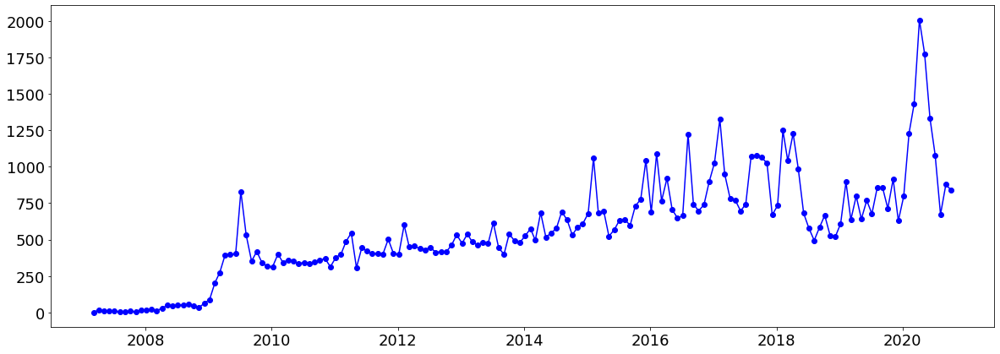

In [167]:
plt.figure(figsize=(20,7))
plt.plot_date(histogram[1][1:], histogram[0], fmt="bo-", tz=None, xdate=True)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

In [142]:
np_dates = np.asarray(dates_list)

In [146]:
year_20 = []
for i in dates_list:
    if i.year == 2020:
        year_20.append(i)

In [148]:
len(year_20)

11238

In [150]:
len(year_20)/len(dates_list)

0.12138166421843948